# **Arquitecturas benchmark: Segmentación de imágenes**

## **Librerías y modulos necesarios**

In [2]:
import os
import sys
import cv2
import glob
import timm
import random
import warnings
import numpy as np
import pandas as pd
from glob import glob
import seaborn as sns
import tensorflow as tf
from joblib import dump, load
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
warnings.filterwarnings("ignore")
from tensorflow.keras.metrics import *
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import SGD, Adam, schedules
from tensorflow.keras import layers, models, losses, optimizers
from sklearn.metrics import roc_curve, precision_recall_curve, balanced_accuracy_score
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Activation, Multiply, Add,Concatenate,
                                     GlobalAveragePooling2D, AveragePooling2D, UpSampling2D, BatchNormalization, Dense, Dropout, GlobalMaxPool2D)

## **Funciones para resultados**

En esta sección, se definen funciones para visualizar las gráficas de cada arquitectura o modelo, con el objetivo de reducir la repetición de código.

In [2]:

import tensorflow.keras.backend as K
import tensorflow as tf

def iou_metric(y_true, y_pred, smooth=1e-6):
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = K.sum(y_true * y_pred, axis=[1, 2, 3])
    union = K.sum(y_true + y_pred, axis=[1, 2, 3]) - intersection
    iou = (intersection + smooth) / (union + smooth)
    return K.mean(iou)

### **Evaluación del modelo**

En este caso mostraremos la máscara binarizada ya que es fundamental en la segmentación de tumores en ultrasonidos, permite evaluar con claridad qué tan bien el modelo ha identificado la región de interés. Al reducir los valores a 0 y 1, se facilita la comparación con la máscara real (ground truth), lo que es esencial para calcular métricas como IoU, Dice Coefficient y Recall de manera precisa. Además, su visualización sobre la imagen original ayuda a detectar posibles errores, como la inclusión de ruido o la omisión de partes del tumor.

In [3]:
def evaluar_modelo(model, X_test, y_test, n = 5, nombre_modelo = "Modelo"):
    """
    Visualiza la segmentación de un modelo en imágenes aleatorias del conjunto de prueba.

    Parámetros:
    - model: modelo de segmentación
    - X_test: conjunto de imágenes de prueba
    - y_test: máscaras reales de prueba
    - n: número de imágenes a visualizar (default = 5)
    - nombre_modelo: nombre del modelo para la figura
    """

    j = np.random.randint(0, X_test.shape[0], n)  # Selecciona n imágenes aleatorias
    fig, ax = plt.subplots(n, 5, figsize=(15, 4 * n))  # n filas, 5 columnas

    for i in range(n):
        img = X_test[j[i]]  # Imagen original
        gt_mask = y_test[j[i]]  # Ground truth
        pred_mask = model.predict(np.expand_dims(img, axis=0), verbose=0)[0]  # Predicción
        binary_pred = (pred_mask > 0.5).astype(np.float32)  # Binarización

        img = img.squeeze()
        gt_mask = gt_mask.squeeze()
        pred_mask = pred_mask.squeeze()
        binary_pred = binary_pred.squeeze()

        ax[i, 0].imshow(img, cmap='gray')
        ax[i, 0].set_title('Imagen original')
        ax[i, 0].axis("off")

        ax[i, 1].imshow(gt_mask, cmap='gray')
        ax[i, 1].set_title('Ground Truth')
        ax[i, 1].axis("off")

        ax[i, 2].imshow(pred_mask, cmap='gray')
        ax[i, 2].set_title('Predicción')
        ax[i, 2].axis("off")

        ax[i, 3].imshow(binary_pred, cmap='gray', vmin=0, vmax=1)
        ax[i, 3].set_title('Máscara Binaria')
        ax[i, 3].axis("off")

        ax[i, 4].imshow(img, cmap='gray')  # Imagen original
        ax[i, 4].imshow(pred_mask, cmap='jet', alpha=0.5)  # Superposición con transparencia
        ax[i, 4].set_title('Superposición Predicción')
        ax[i, 4].axis("off")

    fig.suptitle(f'Comparación Visual - {nombre_modelo}', fontsize=18)
    plt.tight_layout()
    plt.show()

### **Mapas de error**

In [4]:
def visualizar_segmentacion(model, X_test, y_test, nombre_modelo="Modelo"):
    """
    Visualiza la segmentación con la imagen original, la máscara real (GT), la predicción binarizada
    y el mapa de errores (FP y FN).

    Parámetros:
    - model: modelo de segmentación entrenado
    - X_test: imágenes de prueba
    - y_test: máscaras de prueba
    - nombre_modelo: nombre del modelo para el título
    """

    # Seleccionar 5 imágenes aleatorias
    j = np.random.randint(0, X_test.shape[0], 5)

    fig, ax = plt.subplots(5, 4, figsize=(15, 18))  # 4 columnas: Original, GT, Predicción, Error

    for i in range(5):
        img = np.squeeze(X_test[j[i]])  # Imagen original
        gt_mask = np.squeeze(y_test[j[i]])  # Ground truth (máscara real)
        pred_mask = model.predict(np.expand_dims(X_test[j[i]], 0), verbose=0)[0]  # Predicción
        binary_pred = np.squeeze((pred_mask > 0.5).astype(np.float32))  # Binarización

        # Calcular Falsos Positivos y Falsos Negativos
        false_positives = (binary_pred == 1) & (gt_mask == 0)  # FP (Predicho 1, pero era 0)
        false_negatives = (binary_pred == 0) & (gt_mask == 1)  # FN (Predicho 0, pero era 1)

        # Crear imagen de error en RGB
        error_map = np.zeros((*gt_mask.shape, 3))  # Imagen RGB vacía
        error_map[..., 0] = false_positives  # Rojo para FP
        error_map[..., 2] = false_negatives  # Azul para FN

        # Imagen original
        ax[i, 0].imshow(img, cmap='gray')
        ax[i, 0].set_title('Imagen Original')
        ax[i, 0].axis("off")

        # Ground Truth (Máscara real)
        ax[i, 1].imshow(gt_mask, cmap='gray')
        ax[i, 1].set_title('Ground Truth')
        ax[i, 1].axis("off")

        # Predicción del modelo
        ax[i, 2].imshow(binary_pred, cmap='gray', vmin=0, vmax=1)
        ax[i, 2].set_title('Predicción Binarizada')
        ax[i, 2].axis("off")

        # Mapa de error
        ax[i, 3].imshow(img, cmap='gray')  # Imagen base
        ax[i, 3].imshow(error_map, alpha=0.6)  # Superposición de errores
        ax[i, 3].set_title('Mapa de Errores (FP: Rojo, FN: Azul)')
        ax[i, 3].axis("off")

    fig.suptitle(f'Análisis de Errores en Segmentación - {nombre_modelo}', fontsize=18)
    plt.tight_layout()
    plt.show()

### **Curvas de evaluación (Loss and accuracy)**

In [5]:
def graficar_historial(history, nombre_modelo="Modelo"):
    """
    Grafica la evolución de la pérdida y precisión durante el entrenamiento.

    Parámetros:
    - history: historial de entrenamiento del modelo (history.history de Keras)
    - nombre_modelo: nombre del modelo para el título de la figura
    """

    best_epoch = np.argmax(history.history["iou_metric"])  # Mejor época (máxima val_accuracy)
    best_val_acc = history.history["val_iou_metric"][best_epoch]  # Mejor val_accuracy
    best_val_loss = history.history["val_loss"][best_epoch]  # Pérdida en la mejor época

    fig, ax = plt.subplots(1, 2, figsize=(12, 4))

    ax[0].plot(history.epoch, history.history["loss"], label="Train loss", color="#8B0A50")  # Rosa oscuro
    ax[0].plot(history.epoch, history.history["val_loss"], label="Validation loss", color="#FF1493")  # Rosa fuerte
    ax[0].scatter(best_epoch, best_val_loss, color='r', marker='x', s=100, label="Best val_loss")  # "X" en mejor modelo
    ax[0].legend()
    ax[0].set_title("Loss")
    ax[0].grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

    ax[1].plot(history.epoch, history.history["iou_metric"], label="Train Iou", color="#8B0A50")
    ax[1].plot(history.epoch, history.history["val_iou_metric"], label="Validation Iou",color="#FF1493")
    ax[1].scatter(best_epoch, best_val_acc, color='r', marker='x', s=100, label="Best val_iou_metric")  # "X" en mejor modelo
    ax[1].legend()
    ax[1].set_title("Mean Iou")
    ax[1].grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)

    fig.suptitle(f'Loss and Mean Iou - {nombre_modelo}', fontsize=16)
    plt.show()


### **Curvas de evaluación**

In [6]:
def plot_roc_pr_curves(y_test, y_pred):
    # Aplanar imágenes
    y_true_flat = y_test.flatten().astype(int)  # Convertir a binario (0 o 1)
    y_pred_flat = y_pred.flatten()  # Mantener probabilidades originales

    # Curva ROC
    fpr, tpr, _ = roc_curve(y_true_flat, y_pred_flat)

    # Curva Precision-Recall
    precision, recall, _ = precision_recall_curve(y_true_flat, y_pred_flat)

    # Estilo del grid
    grid_style = dict(color='gray', linestyle='--', linewidth=0.6, alpha=0.7)

    # Graficar Curva ROC
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='blue', linewidth=2)
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', linewidth=1)  # Línea aleatoria
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.grid(**grid_style)

    # Graficar Curva Precision-Recall
    plt.subplot(1, 2, 2)
    plt.plot(recall, precision, color='green', linewidth=2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.grid(**grid_style)

    plt.tight_layout()
    plt.show()

### **Boxplots para dispersión de métricas**

In [7]:
def boxplots(y_test, y_pred, threshold=0.5):
    """
    Calcula métricas de segmentación y genera un boxplot con su distribución.

    Parámetros:
    - y_test: Array de máscaras reales.
    - y_pred: Array de predicciones de la red neuronal (probabilidades).
    - threshold: Umbral para binarizar las predicciones.
    """
    # Listas para almacenar métricas de cada muestra
    dice_scores = []
    iou_scores = []
    precision_scores = []
    recall_scores = []
    auc_scores = []
    balanced_acc_scores = []

    # Iterar sobre cada muestra en el dataset
    for i in range(len(y_test)):
        y_true = y_test[i].flatten().astype(int)  # Aplanar y binarizar
        y_pred_prob = y_pred[i].flatten()  # Probabilidades originales
        y_pred_binary = (y_pred_prob > threshold).astype(int)  # Aplicar umbral

        # Dice Coefficient
        intersection = np.sum(y_pred_binary * y_true)
        union = np.sum(y_pred_binary) + np.sum(y_true)
        dice = (2. * intersection) / (union + 1e-7)
        dice_scores.append(dice)

        # IoU (Jaccard Index)
        iou = intersection / (union - intersection + 1e-7)
        iou_scores.append(iou)

        # Precision y Recall
        precision = np.sum(y_pred_binary * y_true) / (np.sum(y_pred_binary) + 1e-7)
        recall = np.sum(y_pred_binary * y_true) / (np.sum(y_true) + 1e-7)
        precision_scores.append(precision)
        recall_scores.append(recall)

        # AUC con TensorFlow
        auc_metric = tf.keras.metrics.AUC()
        auc_metric.update_state(y_true, y_pred_binary)
        auc_value = auc_metric.result().numpy()
        auc_scores.append(auc_value)

        # Balanced Accuracy
        balanced_acc = balanced_accuracy_score(y_true, y_pred_binary)
        balanced_acc_scores.append(balanced_acc)

    # Crear DataFrame con métricas
    df_metrics = pd.DataFrame({
        "Dice Coefficient": dice_scores,
        "IoU": iou_scores,
        "Precision": precision_scores,
        "Recall": recall_scores,
        "AUC": auc_scores,
        "Balanced Accuracy": balanced_acc_scores
    })

    # Configurar estilo de gráficos
    sns.set_style("whitegrid")

    # Crear boxplots para cada métrica
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df_metrics)
    plt.xticks(rotation=45)
    plt.title("Distribución de métricas - Boxplots")
    plt.show()


## **Conjuntos de entrenamiento y test**

Inicialmente, cargamos los conjuntos de imágenes y sus respectivas máscaras, previamente generadas durante el preprocesamiento y el análisis exploratorio de datos (EDA), las cuales están listas para la implementación de las arquitecturas.

In [8]:
X = np.load("/content/imagenes_cancer.npy")
y = np.load("/content/mascaras_cancer.npy")

En esta etapa, expandimos la dimensión de los conjuntos de imágenes (`X`) y sus respectivas máscaras (`y`) para adecuarlos al formato requerido por los modelos de segmentación. Luego, mostramos sus formas resultantes para verificar que la transformación se realizó correctamente.

In [9]:
X = np.expand_dims(X, -1)
y = np.expand_dims(y, -1)

print(f"\nForma de X: {X.shape}  |  Forma de y: {y.shape}")


Forma de X: (682, 128, 128, 1)  |  Forma de y: (682, 128, 128, 1)


Ahora, se mezclan aleatoriamente los datos antes de dividirlos, asegurando una distribución más equitativa en los conjuntos de entrenamiento y prueba. Para ello, se generan índices ordenados, se reorganizan aleatoriamente y luego se aplican a los conjuntos de imágenes (`X`) y sus respectivas máscaras (`y`).

In [10]:
# Mezclar aleatoriamente los datos antes de dividir
indices = np.arange(len(X))
random.seed(11)
np.random.shuffle(indices)

X = X[indices]
y = y[indices]

Dividimos el conjunto de datos en entrenamiento y prueba, asignando un 90% para entrenamiento y un 10% para prueba. Esto nos permite evaluar el desempeño del modelo en datos no vistos mediante métricas calculadas sobre el conjunto de prueba. Posteriormente, dentro del conjunto de entrenamiento, realizamos una nueva división para obtener un subconjunto de validación. Esta separación es fundamental para monitorear el rendimiento del modelo durante el entrenamiento y ajustar hiperparámetros sin comprometer la evaluación final.

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1,random_state = 11)
print('X_train shape:',X_train.shape)
print('y_train shape:',y_train.shape)
print('X_test shape:',X_test.shape)
print('y_test shape:',y_test.shape)

X_train shape: (613, 128, 128, 1)
y_train shape: (613, 128, 128, 1)
X_test shape: (69, 128, 128, 1)
y_test shape: (69, 128, 128, 1)


In [12]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.2, random_state = 11)

In [13]:
print('X_train shape:',X_train.shape)
print('y_train shape:',y_train.shape)
print('X_val shape:',X_val.shape)
print('y_val shape:',y_val.shape)

X_train shape: (490, 128, 128, 1)
y_train shape: (490, 128, 128, 1)
X_val shape: (123, 128, 128, 1)
y_val shape: (123, 128, 128, 1)


## **Data Augmentation**

En esta sección, aplicamos **aumento de datos (Data Augmentation)** para mejorar la capacidad de generalización de los modelos de segmentación. Esto se logra aplicando transformaciones aleatorias, como rotaciones, escalado, volteo horizontal y vertical, a las imágenes y sus respectivas máscaras.  

`````{admonition} ¿Por qué se hace antes de entrenar los modelos?
:class: tip
El Data Augmentation permite generar variaciones de las imágenes originales, lo que ayuda a reducir el sobreajuste (overfitting) y mejora el rendimiento del modelo en datos no vistos. Al aplicar estas transformaciones durante el entrenamiento, el modelo aprende a reconocer patrones más robustos y generalizables.  
`````

`````{admonition}  ¿Por qué solo se usan los conjuntos de entrenamiento?
:class: tip
El conjunto de prueba (`X_test`, `y_test`) se reserva para evaluar el modelo sin alteraciones, asegurando que la evaluación refleje un rendimiento realista en datos no vistos. Si se aplicara Data Augmentation al conjunto de prueba, los resultados no serían representativos.  
`````


En este código, se define un diccionario con los parámetros de transformación y se usa `ImageDataGenerator` para aplicarlos tanto a las imágenes como a sus máscaras. Luego, `fit()` se encarga de ajustar el generador a los datos de entrenamiento, asegurando que las transformaciones se apliquen correctamente durante el proceso de entrenamiento del modelo.

In [14]:
data_gen_args = dict(
    rotation_range=60,  # Rotación aleatoria de hasta ±60 grados
    zoom_range=[0.6, 1.0],  # Zoom aleatorio entre 60% y 100% del tamaño original
    horizontal_flip=True,  # Permite voltear horizontalmente la imagen
    vertical_flip=True,  # Permite voltear verticalmente la imagen
    fill_mode="nearest"  # Método para rellenar píxeles vacíos tras la transformación
)


In [15]:
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)
seed = 1

In [16]:
image_datagen.fit(X_train, augment=True, seed=seed)
mask_datagen.fit(y_train, augment=True, seed=seed)

## **Implementación de modelos y arquitecturas**

### **UNet**

#### **Arquitectura y entrenamiento**

In [ ]:
def conv_block(input, num_filters):
    conv = Conv2D(num_filters, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(input)
    conv = Conv2D(num_filters, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(conv)
    return conv

def encoder_block(input, num_filters):
    conv = conv_block(input, num_filters)
    pool = MaxPooling2D((2, 2))(conv)
    return conv, pool

def decoder_block(input, skip_features, num_filters):
    uconv = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    con = concatenate([uconv, skip_features])
    conv = conv_block(con, num_filters)
    return conv

In [ ]:
def build_model(input_shape):
    input_layer = Input(input_shape)

    s1, p1 = encoder_block(input_layer, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    output_layer = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(input_layer, output_layer, name="U-Net")
    return model

model_unet = build_model(input_shape=(128, 128, 1))
model_unet.compile(loss="binary_crossentropy", optimizer="Adam",metrics=[iou_metric])

In [ ]:
checkpointer = [
    EarlyStopping(monitor='val_mean_io_u', verbose=1, restore_best_weights=True, mode='max', patience=10),
    ModelCheckpoint(
        filepath='model.weights.best.keras',
        monitor='val_mean_io_u',
        verbose=1,
        save_best_only=True,
        mode='max'
)
]

In [ ]:
history_unet = None

if os.path.exists('history_unet.joblib'):
    history_unet = load('history_unet.joblib')
    print("El archivo 'history_unet.joblib' ya existe. Se ha cargado el historial del entrenamiento.")
else:
    history_unet = model_unet.fit(
        X_train, y_train,
        epochs=100,
        validation_data=(X_val, y_val),
        callbacks=checkpointer,
        verbose=2,
        batch_size=10
    )
    dump(history_unet.history, 'history_unet.joblib')
    print("El entrenamiento se ha completado y el historial ha sido guardado en 'history_unet.joblib'.")

Epoch 1/100
49/49 - 36s - 743ms/step - iou_metric: 0.0043 - loss: 0.4303 - val_iou_metric: 2.6179e-09 - val_loss: 0.3134
Epoch 2/100
49/49 - 9s - 176ms/step - iou_metric: 0.0011 - loss: 0.3067 - val_iou_metric: 5.7757e-04 - val_loss: 0.2778
Epoch 3/100
49/49 - 11s - 225ms/step - iou_metric: 0.0123 - loss: 0.2720 - val_iou_metric: 0.0111 - val_loss: 0.2368
Epoch 4/100
49/49 - 10s - 207ms/step - iou_metric: 0.0992 - loss: 0.2346 - val_iou_metric: 0.3340 - val_loss: 0.2096
Epoch 5/100
49/49 - 9s - 176ms/step - iou_metric: 0.1605 - loss: 0.2203 - val_iou_metric: 0.2417 - val_loss: 0.2077
Epoch 6/100
49/49 - 10s - 207ms/step - iou_metric: 0.0473 - loss: 0.2282 - val_iou_metric: 0.0456 - val_loss: 0.2120
Epoch 7/100
49/49 - 10s - 208ms/step - iou_metric: 0.1326 - loss: 0.2070 - val_iou_metric: 0.1776 - val_loss: 0.1890
Epoch 8/100
49/49 - 10s - 210ms/step - iou_metric: 0.2026 - loss: 0.2005 - val_iou_metric: 0.2834 - val_loss: 0.1849
Epoch 9/100
49/49 - 10s - 209ms/step - iou_metric: 0.2568 

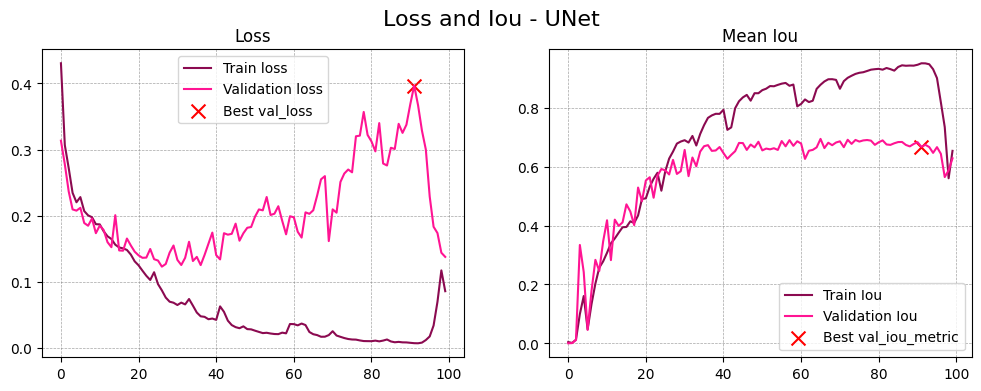

In [ ]:
graficar_historial(history_unet, nombre_modelo="UNet")

#### **Métricas de evaluación**

In [ ]:
y_pred = model_unet.predict(X_test, verbose=0)
y_pred_thresholded = y_pred > 0.5

IOU_keras = MeanIoU(num_classes=2)
IOU_keras.update_state(y_pred_thresholded, y_test)
iou_score = IOU_keras.result().numpy()

prec_score = Precision()
prec_score.update_state(y_pred_thresholded, y_test)
p = prec_score.result().numpy()

recall_score = Recall()
recall_score.update_state(y_pred_thresholded, y_test)
r = recall_score.result().numpy()

auc_score = AUC()
auc_score.update_state(y_pred_thresholded, y_test)
auc = auc_score.result().numpy()


intersection = np.sum(y_pred_thresholded * y_test)
union = np.sum(y_pred_thresholded) + np.sum(y_test)
dice_coefficient = (2. * intersection) / (union + 1e-7)  # Evitar división por cero


balanced_accuracy = (p + r) / 2

metrics_dict = {
    "Dice Coefficient": dice_coefficient,
    "Mean IoU": iou_score,
    "Precision": p,
    "Recall": r,
    "AUC": auc,
    "Balanced Accuracy": balanced_accuracy}

df_metrics_unet = pd.DataFrame(metrics_dict, index=["Segmentación U-Net"])
df_metrics_unet.to_csv("resultados_unet.csv")
df_metrics_unet

,Dice Coefficient,Mean IoU,Precision,Recall,AUC,Balanced Accuracy
Segmentación U-Net,0.727057,0.754134,0.662543,0.805402,0.882914,0.733972


#### **Comparación visual**

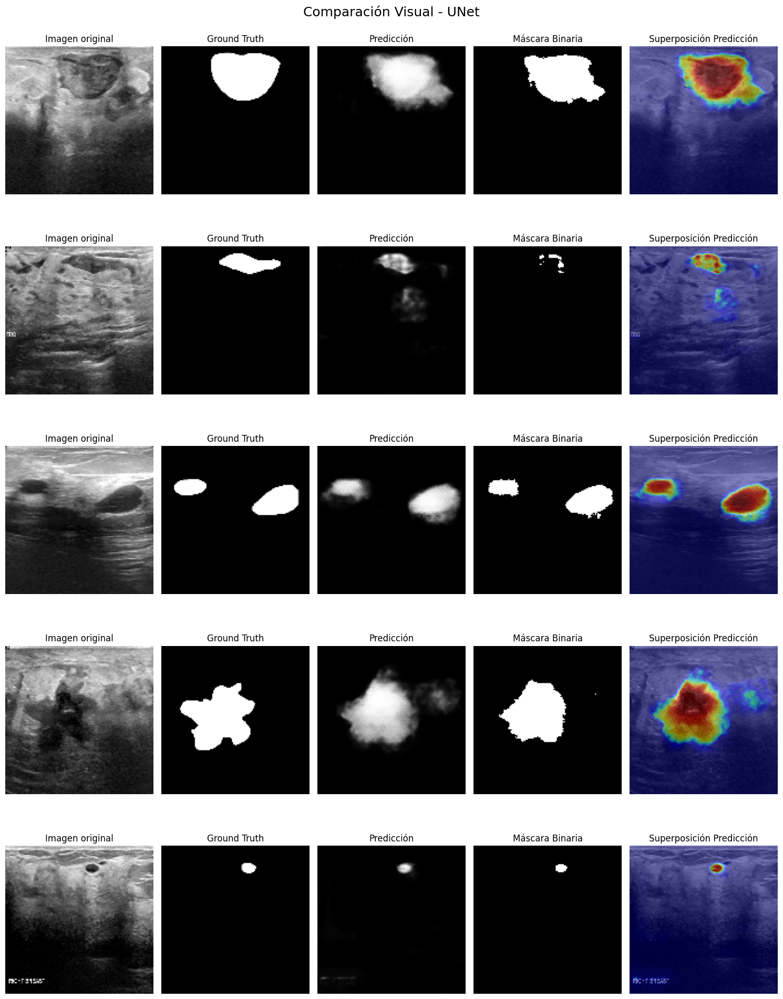

In [ ]:
evaluar_modelo(model_unet, X_test, y_test, nombre_modelo="UNet")

#### **Mapas de error**

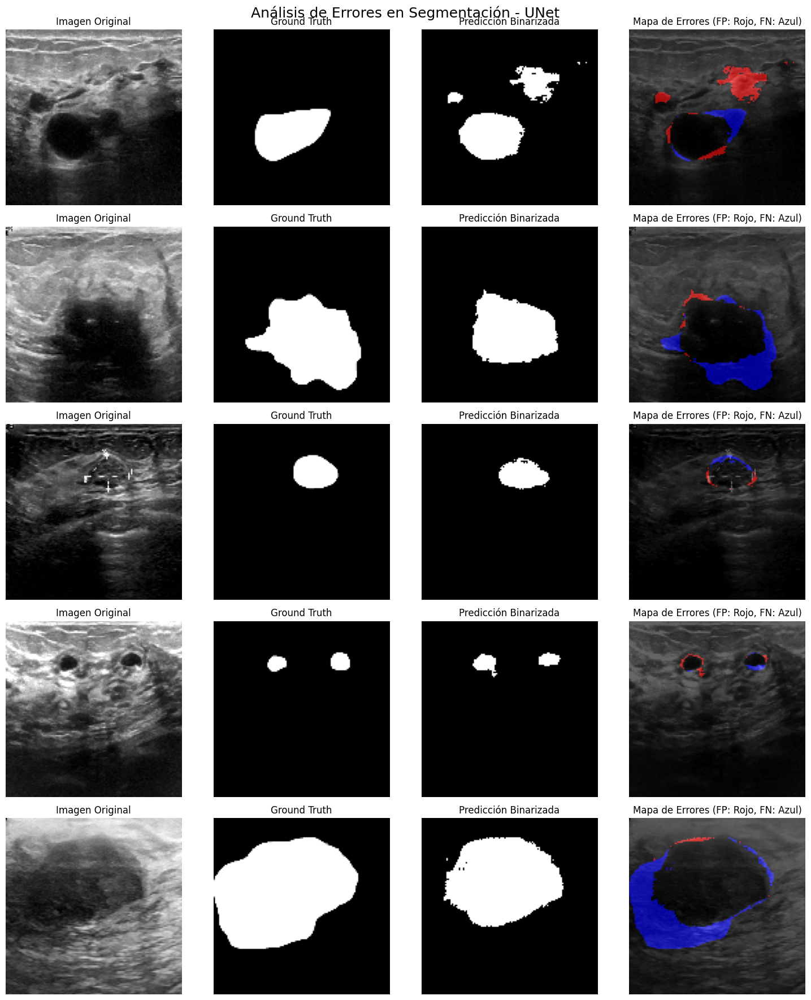

In [ ]:
visualizar_segmentacion(model_unet, X_test, y_test, nombre_modelo="UNet")

#### **Curvas de evaluación**

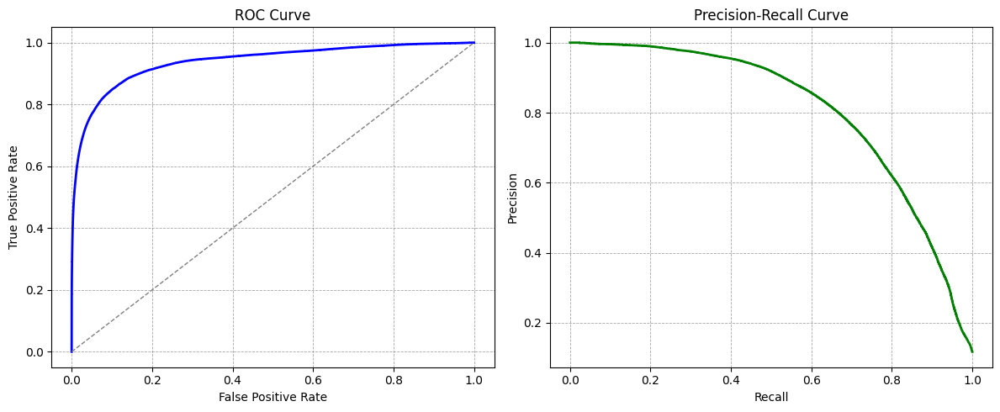

In [ ]:
plot_roc_pr_curves(y_test, y_pred)

#### **Distribución de métricas**

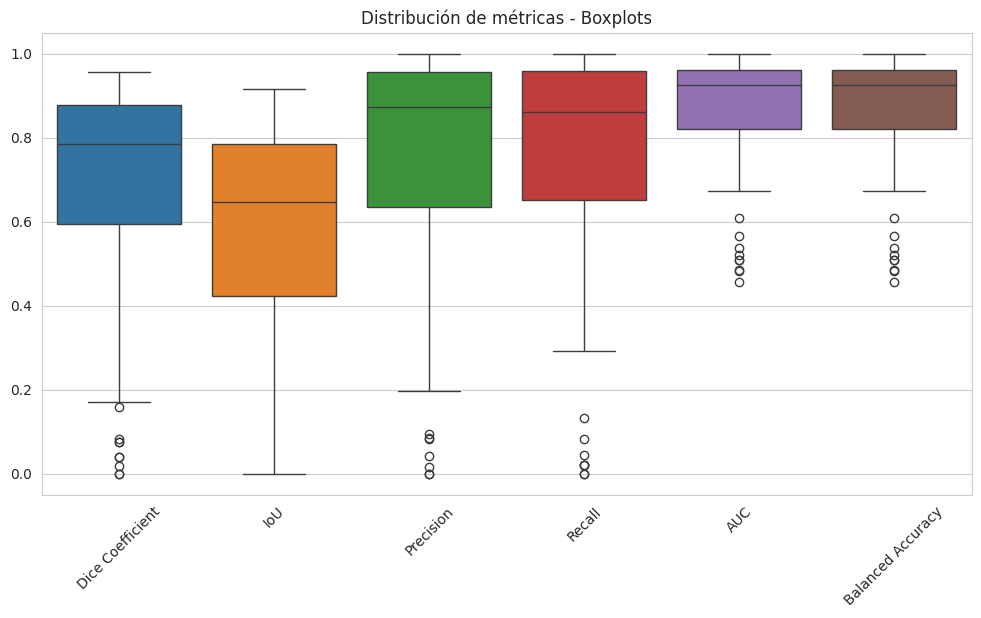

In [ ]:
boxplots(y_test, y_pred)

### **VNet**

Aunque VNet fue diseñado originalmente para segmentación de imágenes médicas en 3D (como volúmenes de resonancia magnética o tomografías), en este caso, se trabajará con imágenes 2D en escala de grises, modificando su arquitectura para utilizar convoluciones 2D en lugar de convoluciones 3D.

#### **Arquitectura y entrenamiento**

In [ ]:
def residual_block(input, num_filters):
    conv1 = Conv2D(num_filters, (3, 3), padding="same", kernel_initializer="he_normal")(input)
    conv1 = tf.keras.layers.ReLU()(conv1)
    conv2 = Conv2D(num_filters, (3, 3), padding="same", kernel_initializer="he_normal")(conv1)

    # Ajustar canales de input si es necesario
    shortcut = Conv2D(num_filters, (1, 1), padding="same")(input)  # Conv 1x1 si los canales son diferentes

    # Residual connection (skip connection)
    res = Add()([shortcut, conv2])  # Ahora los canales coinciden
    res = tf.keras.layers.ReLU()(res)
    return res


def encoder_block(input, num_filters):
    res = residual_block(input, num_filters)
    pool = MaxPooling2D((2, 2))(res)
    return res, pool

def decoder_block(input, skip_features, num_filters):
    up = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    res = residual_block(up, num_filters)
    output = Add()([res, skip_features])  # Residual skip connection
    return output


def build_vnet(input_shape):
    input_layer = Input(input_shape)

    # Encoder
    s1, p1 = encoder_block(input_layer, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # Bottleneck
    b1 = residual_block(p4, 1024)

    # Decoder
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    output_layer = Conv2D(1, 1, activation="sigmoid", padding="same")(d4)

    model = Model(input_layer, output_layer, name="V-Net")
    return model



# Crear el modelo V-Net
model_vnet = build_vnet(input_shape=(128, 128, 1))
model_vnet.compile(loss="binary_crossentropy", optimizer="Adam", metrics=[iou_metric])

In [ ]:
checkpointer = [
    EarlyStopping(monitor='val_mean_io_u', verbose=1, restore_best_weights=True, mode='max', patience=10),
    ModelCheckpoint(
        filepath='model_vnet.weights.best.keras',
        monitor='val_mean_io_u',
        verbose=1,
        save_best_only=True,
        mode='max'
    )
]

history_vnet = None

if os.path.exists('history_vnet.joblib'):
    history_vnet = load('history_vnet.joblib')
    print("El archivo 'history_vnet.joblib' ya existe. Se ha cargado el historial del entrenamiento.")
else:
    history_vnet = model_vnet.fit(
        X_train, y_train,
        epochs=100,
        validation_data=(X_val, y_val),
        callbacks=checkpointer,
        verbose=2,
        batch_size=10
    )
    dump(history_vnet.history, 'history_vnet.joblib')
    print("El entrenamiento se ha completado y el historial ha sido guardado en 'history_vnet.joblib'.")

Epoch 1/100
49/49 - 26s - 523ms/step - iou_metric: 0.0068 - loss: 2.8694 - val_iou_metric: 0.0016 - val_loss: 0.3058
Epoch 2/100
49/49 - 8s - 154ms/step - iou_metric: 0.0298 - loss: 0.2609 - val_iou_metric: 0.0115 - val_loss: 0.2402
Epoch 3/100
49/49 - 8s - 153ms/step - iou_metric: 0.1742 - loss: 0.2254 - val_iou_metric: 0.2959 - val_loss: 0.2100
Epoch 4/100
49/49 - 8s - 154ms/step - iou_metric: 0.1935 - loss: 0.2189 - val_iou_metric: 0.3263 - val_loss: 0.2025
Epoch 5/100
49/49 - 8s - 156ms/step - iou_metric: 0.2633 - loss: 0.2047 - val_iou_metric: 0.3977 - val_loss: 0.1732
Epoch 6/100
49/49 - 8s - 160ms/step - iou_metric: 0.3027 - loss: 0.1903 - val_iou_metric: 0.4152 - val_loss: 0.1613
Epoch 7/100
49/49 - 10s - 210ms/step - iou_metric: 0.2859 - loss: 0.1938 - val_iou_metric: 0.4589 - val_loss: 0.1842
Epoch 8/100
49/49 - 10s - 211ms/step - iou_metric: 0.3480 - loss: 0.1832 - val_iou_metric: 0.4335 - val_loss: 0.2108
Epoch 9/100
49/49 - 10s - 208ms/step - iou_metric: 0.3212 - loss: 0.1

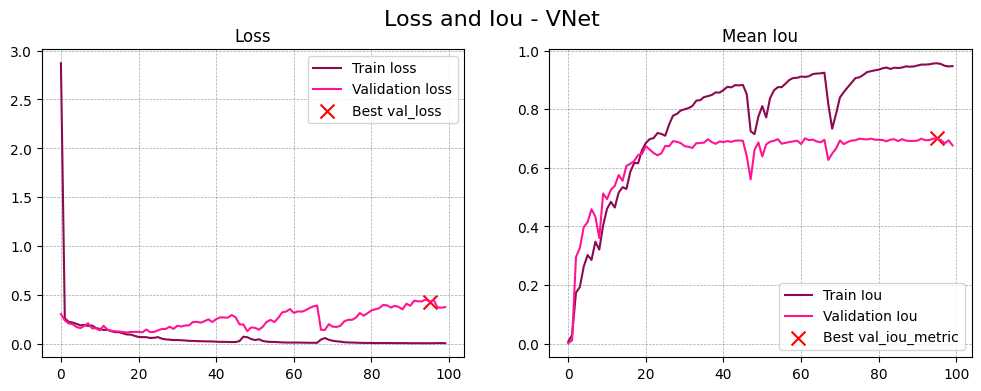

In [ ]:
graficar_historial(history_vnet, nombre_modelo="VNet")

#### **Métricas de evaluación**

In [ ]:
y_pred = model_vnet.predict(X_test, verbose=0)
y_pred_thresholded = y_pred > 0.5

IOU_keras = MeanIoU(num_classes=2)
IOU_keras.update_state(y_pred_thresholded, y_test)
iou_score = IOU_keras.result().numpy()

prec_score = Precision()
prec_score.update_state(y_pred_thresholded, y_test)
p = prec_score.result().numpy()

recall_score = Recall()
recall_score.update_state(y_pred_thresholded, y_test)
r = recall_score.result().numpy()

auc_score = AUC()
auc_score.update_state(y_pred_thresholded, y_test)
auc = auc_score.result().numpy()


intersection = np.sum(y_pred_thresholded * y_test)
union = np.sum(y_pred_thresholded) + np.sum(y_test)
dice_coefficient = (2. * intersection) / (union + 1e-7)  # Evitar división por cero


balanced_accuracy = (p + r) / 2

metrics_dict = {
    "Dice Coefficient": dice_coefficient,
    "Mean IoU": iou_score,
    "Precision": p,
    "Recall": r,
    "AUC": auc,
    "Balanced Accuracy": balanced_accuracy}

df_metrics_unet = pd.DataFrame(metrics_dict, index=["Segmentación VNet"])
df_metrics_unet.to_csv("resultados_vnet.csv")
df_metrics_unet

,Dice Coefficient,Mean IoU,Precision,Recall,AUC,Balanced Accuracy
Segmentación VNet,0.73928,0.764111,0.657537,0.844551,0.902005,0.751044


#### **Comparación visual**

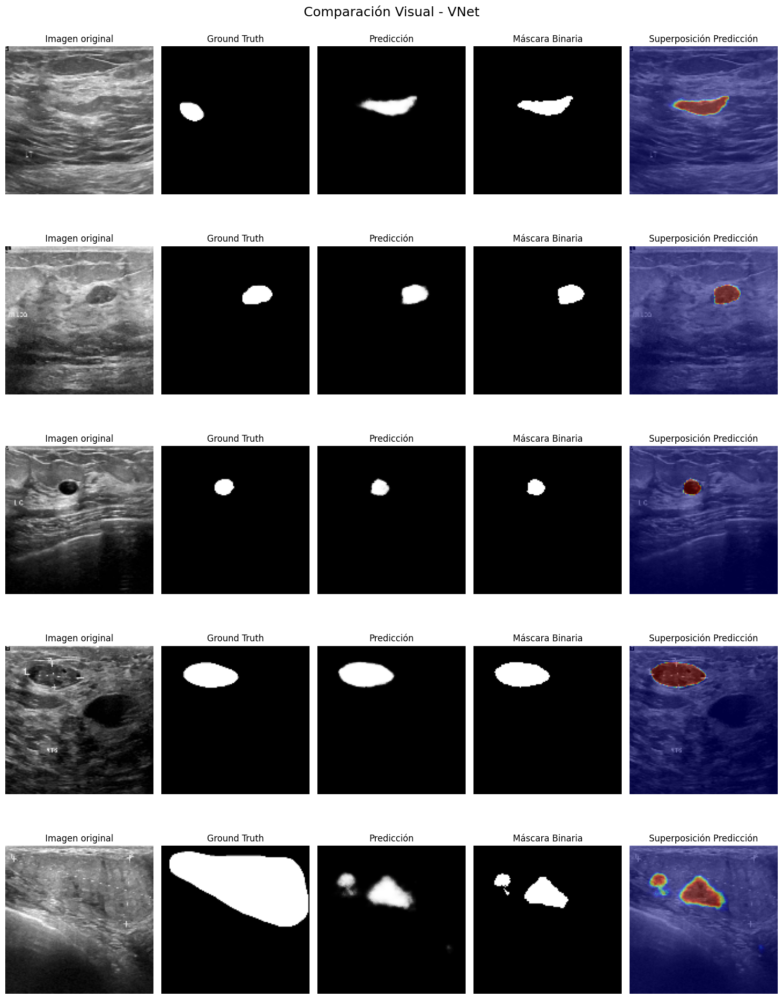

In [ ]:
evaluar_modelo(model_vnet, X_test, y_test, nombre_modelo="VNet")

#### **Mapas de error**

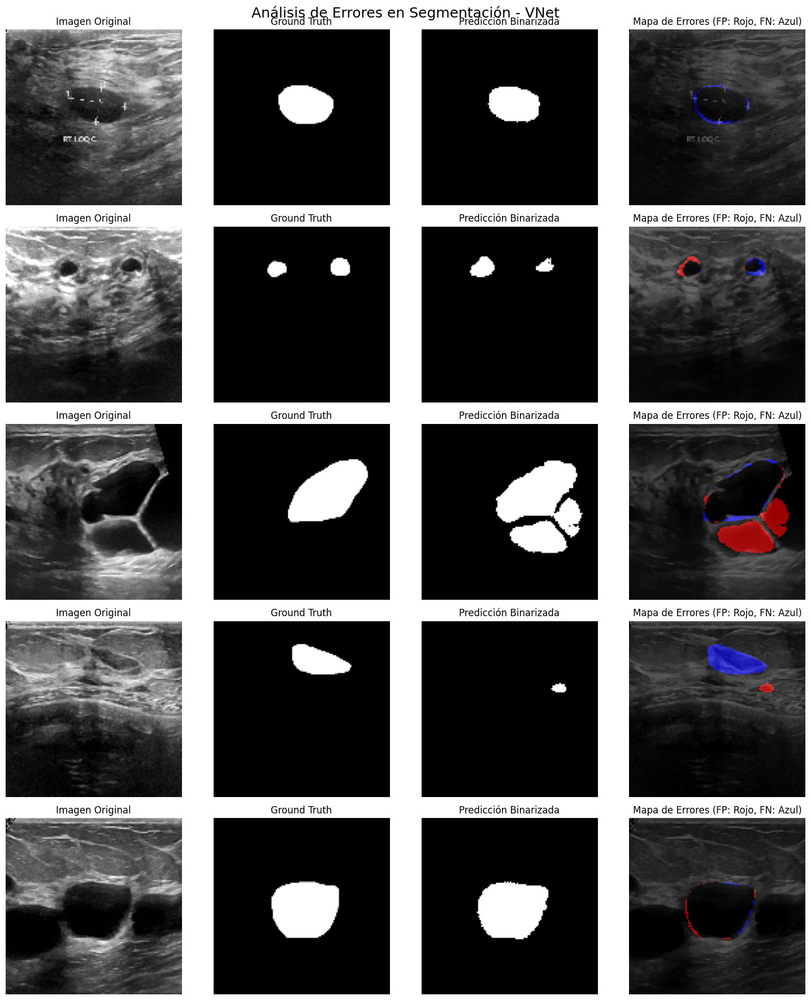

In [ ]:
visualizar_segmentacion(model_vnet, X_test, y_test, nombre_modelo="VNet")

#### **Curvas de evaluación**

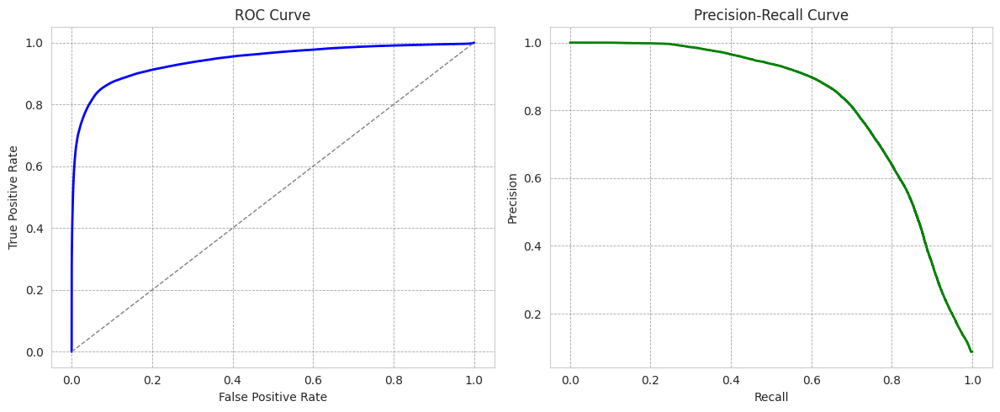

In [ ]:
plot_roc_pr_curves(y_test, y_pred)

#### **Distribución de métricas**

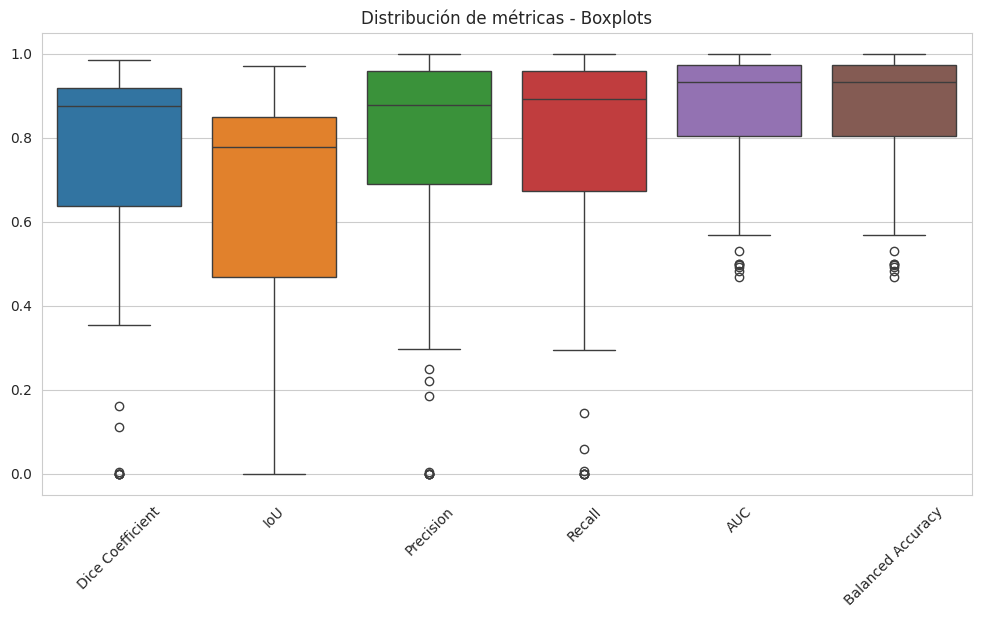

In [ ]:
boxplots(y_test, y_pred)

### **SegNet**

#### **Arquitectura y entrenamiento**

In [ ]:
def encoder_block(input_layer, num_filters):
    """
    Bloque del codificador con BatchNorm + ReLU + Dropout
    """
    # Primera convolución
    x = Conv2D(num_filters, (3, 3), padding="same")(input_layer)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Dropout(0.2)(x)

    # Segunda convolución
    x = Conv2D(num_filters, (3, 3), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Dropout(0.2)(x)

    p = MaxPooling2D((2, 2), strides=2, padding="same")(x)
    return x, p

def decoder_block(input_layer, skip_layer, num_filters):
    """
    Bloque del decodificador: Upsampling seguido de convoluciones.
    """
    x = UpSampling2D((2, 2))(input_layer)
    x = Conv2D(num_filters, (3, 3), padding="same", activation="relu")(x)
    x = Conv2D(num_filters, (3, 3), padding="same", activation="relu")(x)
    return x


input_layer = Input((128, 128, 1))

# Codificador
e1, p1 = encoder_block(input_layer, 64)
e2, p2 = encoder_block(p1, 128)
e3, p3 = encoder_block(p2, 256)

# Bottleneck
b = Conv2D(512, (3, 3), padding="same", activation="relu")(p3)
b = Conv2D(512, (3, 3), padding="same", activation="relu")(b)

# Decodificador
d3 = decoder_block(b, e3, 256)
d2 = decoder_block(d3, e2, 128)
d1 = decoder_block(d2, e1, 64)

# Capa de salida
output_layer = Conv2D(1, (1, 1), activation="sigmoid")(d1)

Seg_Net = Model(input_layer, output_layer, name="SegNet")
Seg_Net.compile(optimizer=Adam(), loss= "binary_crossentropy", metrics=[iou_metric])


In [ ]:
checkpointer = [
    EarlyStopping(monitor='val_mean_io_u', verbose=1, restore_best_weights=True, mode='max', patience=10),
    ModelCheckpoint(filepath='model_fcn.weights.best.keras',
                    monitor='val_mean_io_u', verbose=1, save_best_only=True, mode='max')
]

X_train = X_train.astype("float32")
y_train = y_train.astype("float32")
X_val = X_val.astype("float32")
y_val = y_val.astype("float32")


history_segnet = None
if os.path.exists('history_segnet.joblib'):
    history_segnet = load('history_segnet.joblib')
    print("Historial de entrenamiento cargado desde 'history_segnet.joblib'.")
else:
    history_segnet = Seg_Net.fit(
        X_train, y_train,
        epochs=100,
        validation_data=(X_val, y_val),
        callbacks=checkpointer,
        verbose=2,
        batch_size=10
    )
    dump(history_segnet.history, 'history_segnet.joblib')
    print("Entrenamiento completado y guardado en 'history_segnet.joblib'.")

Epoch 1/100
49/49 - 31s - 629ms/step - iou_metric: 0.0026 - loss: 0.4455 - val_iou_metric: 2.6179e-09 - val_loss: 0.3626
Epoch 2/100
49/49 - 6s - 116ms/step - iou_metric: 2.1900e-09 - loss: 0.2660 - val_iou_metric: 2.6179e-09 - val_loss: 0.2917
Epoch 3/100
49/49 - 6s - 116ms/step - iou_metric: 2.1900e-09 - loss: 0.2354 - val_iou_metric: 2.6179e-09 - val_loss: 0.2714
Epoch 4/100
49/49 - 10s - 214ms/step - iou_metric: 0.0684 - loss: 0.2295 - val_iou_metric: 2.6179e-09 - val_loss: 0.2928
Epoch 5/100
49/49 - 10s - 212ms/step - iou_metric: 0.1904 - loss: 0.2130 - val_iou_metric: 2.6179e-09 - val_loss: 0.2570
Epoch 6/100
49/49 - 6s - 126ms/step - iou_metric: 0.2809 - loss: 0.2032 - val_iou_metric: 2.6179e-09 - val_loss: 0.2632
Epoch 7/100
49/49 - 6s - 125ms/step - iou_metric: 0.3039 - loss: 0.1969 - val_iou_metric: 2.6179e-09 - val_loss: 0.2540
Epoch 8/100
49/49 - 6s - 120ms/step - iou_metric: 0.3616 - loss: 0.1777 - val_iou_metric: 2.6179e-09 - val_loss: 0.2460
Epoch 9/100
49/49 - 10s - 213

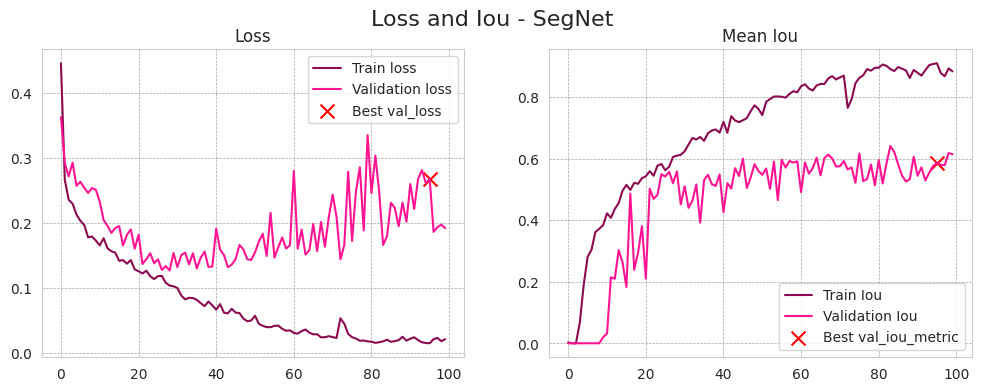

In [ ]:
graficar_historial(history_segnet, nombre_modelo="SegNet")

#### **Métricas de evaluación**

In [ ]:
y_pred = Seg_Net.predict(X_test, verbose=0)
y_pred_thresholded = y_pred > 0.5

IOU_keras = MeanIoU(num_classes=2)
IOU_keras.update_state(y_pred_thresholded, y_test)
iou_score = IOU_keras.result().numpy()

prec_score = Precision()
prec_score.update_state(y_pred_thresholded, y_test)
p = prec_score.result().numpy()

recall_score = Recall()
recall_score.update_state(y_pred_thresholded, y_test)
r = recall_score.result().numpy()

auc_score = AUC()
auc_score.update_state(y_pred_thresholded, y_test)
auc = auc_score.result().numpy()


intersection = np.sum(y_pred_thresholded * y_test)
union = np.sum(y_pred_thresholded) + np.sum(y_test)
dice_coefficient = (2. * intersection) / (union + 1e-7)  # Evitar división por cero


balanced_accuracy = (p + r) / 2

metrics_dict = {
    "Dice Coefficient": dice_coefficient,
    "Mean IoU": iou_score,
    "Precision": p,
    "Recall": r,
    "AUC": auc,
    "Balanced Accuracy": balanced_accuracy}

df_metrics_segnet = pd.DataFrame(metrics_dict, index=["Segmentación Seg-Net"])
df_metrics_segnet.to_csv("resultados_segnet.csv")
df_metrics_segnet

,Dice Coefficient,Mean IoU,Precision,Recall,AUC,Balanced Accuracy
Segmentación Seg-Net,0.666454,0.714102,0.571378,0.799591,0.874364,0.685484


#### **Comparación visual**

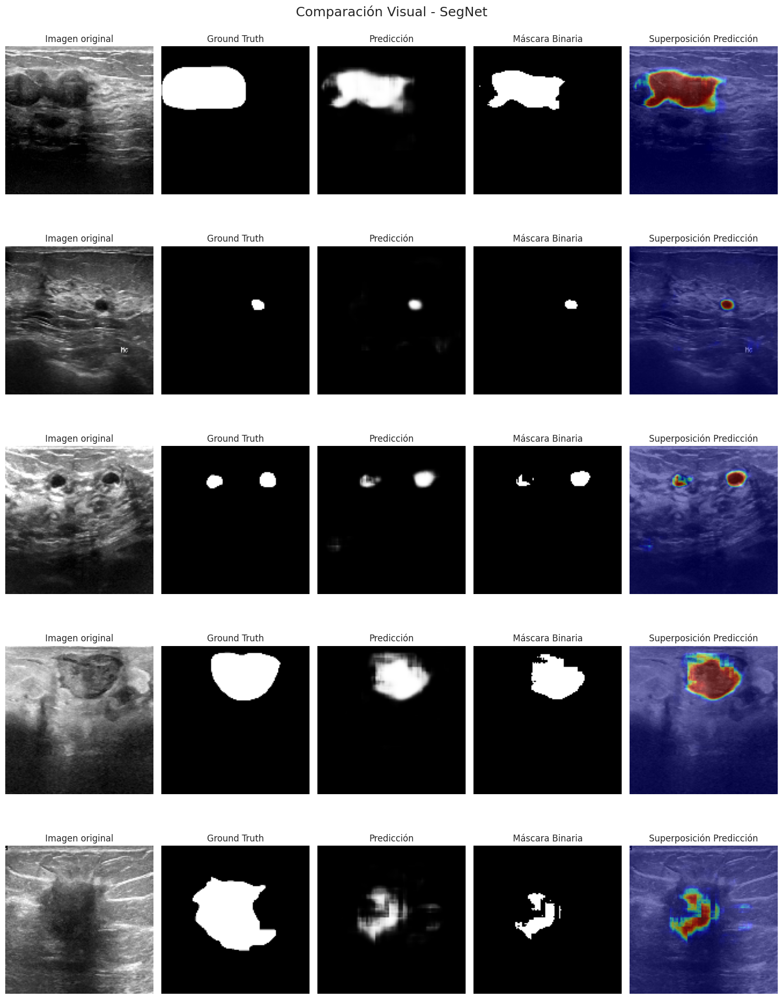

In [ ]:
evaluar_modelo(Seg_Net, X_test, y_test, nombre_modelo="SegNet")

#### **Mapas de error**

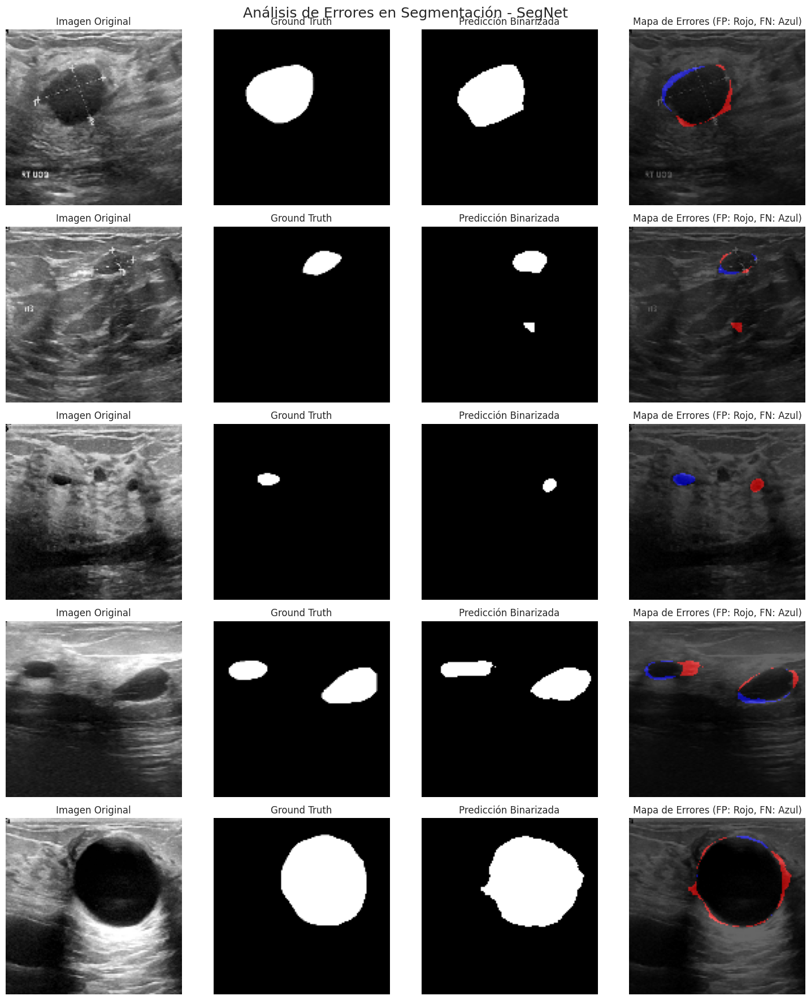

In [ ]:
visualizar_segmentacion(Seg_Net, X_test, y_test, nombre_modelo="SegNet")

#### **Curvas de evaluación**

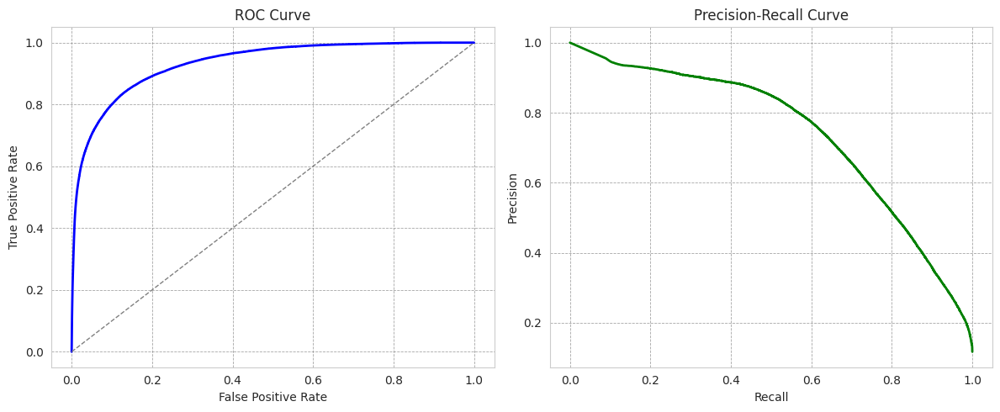

In [ ]:
plot_roc_pr_curves(y_test, y_pred)

#### **Distribución de métricas**

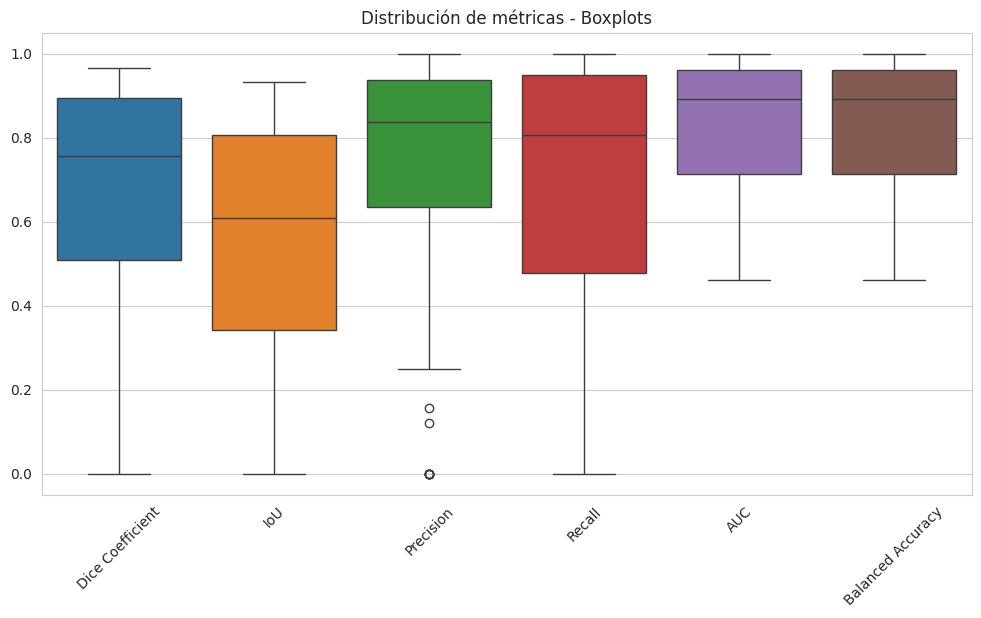

In [ ]:
boxplots(y_test, y_pred)

### **Attention UNet**

#### **Arquitectura y entrenamiento**

In [ ]:
def conv_block(input, num_filters):
    conv = Conv2D(num_filters, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(input)
    conv = Conv2D(num_filters, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(conv)
    return conv

def attention_gate(input, skip_features, num_filters):
    g = Conv2D(num_filters, (1, 1), padding='same')(input)
    s = Conv2D(num_filters, (1, 1), padding='same')(skip_features)
    attn = Add()([g, s])
    attn = Activation('relu')(attn)
    attn = Conv2D(1, (1, 1), padding='same', activation='sigmoid')(attn)
    attn = Multiply()([skip_features, attn])
    return attn

def encoder_block(input, num_filters):
    conv = conv_block(input, num_filters)
    pool = MaxPooling2D((2, 2))(conv)
    return conv, pool

def decoder_block(input, skip_features, num_filters):
    uconv = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    attn = attention_gate(uconv, skip_features, num_filters)
    con = concatenate([uconv, attn])
    conv = conv_block(con, num_filters)
    return conv

In [ ]:
def build_attention_unet(input_shape):
    input_layer = Input(input_shape)

    s1, p1 = encoder_block(input_layer, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    output_layer = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(input_layer, output_layer, name="Attention-U-Net")
    return model

model_att_unet = build_attention_unet(input_shape=(128, 128, 1))
model_att_unet.compile(loss="binary_crossentropy", optimizer="Adam", metrics=[iou_metric])

In [ ]:
checkpointer = [
    EarlyStopping(monitor='val_mean_io_u', verbose=1, restore_best_weights=True, mode='max', patience=10),
    ModelCheckpoint(
        filepath='model_att.weights.best.keras',
        monitor='val_mean_io_u',
        verbose=1,
        save_best_only=True,
        mode='max'
    )
]

history_att_unet = None

if os.path.exists('history_att_unet.joblib'):
    history_att_unet = load('history_att_unet.joblib')
    print("El archivo 'history_att_unet.joblib' ya existe. Se ha cargado el historial del entrenamiento.")
else:
    history_att_unet = model_att_unet.fit(
        X_train, y_train,
        epochs=100,
        validation_data=(X_val, y_val),
        callbacks=checkpointer,
        verbose=2,
        batch_size=10
    )
    dump(history_att_unet.history, 'history_att_unet.joblib')
    print("El entrenamiento se ha completado y el historial ha sido guardado en 'history_att_unet.joblib'.")


Epoch 1/100
49/49 - 27s - 548ms/step - iou_metric: 0.0034 - loss: 0.3686 - val_iou_metric: 2.3659e-06 - val_loss: 0.2692
Epoch 2/100
49/49 - 9s - 191ms/step - iou_metric: 0.0082 - loss: 0.3227 - val_iou_metric: 2.6179e-09 - val_loss: 0.3029
Epoch 3/100
49/49 - 10s - 212ms/step - iou_metric: 0.0342 - loss: 0.2627 - val_iou_metric: 0.1974 - val_loss: 0.2542
Epoch 4/100
49/49 - 11s - 223ms/step - iou_metric: 0.1781 - loss: 0.2349 - val_iou_metric: 0.2972 - val_loss: 0.2114
Epoch 5/100
49/49 - 20s - 401ms/step - iou_metric: 0.0744 - loss: 0.2300 - val_iou_metric: 0.0015 - val_loss: 0.2250
Epoch 6/100
49/49 - 11s - 222ms/step - iou_metric: 0.1169 - loss: 0.2141 - val_iou_metric: 0.3481 - val_loss: 0.2054
Epoch 7/100
49/49 - 10s - 198ms/step - iou_metric: 0.2668 - loss: 0.2096 - val_iou_metric: 0.4051 - val_loss: 0.1968
Epoch 8/100
49/49 - 10s - 209ms/step - iou_metric: 0.3713 - loss: 0.1953 - val_iou_metric: 0.4824 - val_loss: 0.1853
Epoch 9/100
49/49 - 11s - 220ms/step - iou_metric: 0.4207

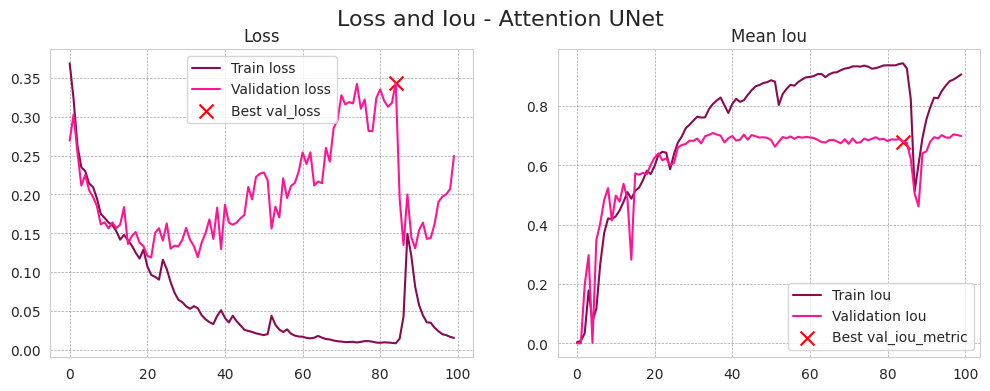

In [ ]:
graficar_historial(history_att_unet, nombre_modelo="Attention UNet")

#### **Métricas de evaluación**

In [ ]:
y_pred=model_att_unet.predict(X_test,verbose=0)
y_pred_thresholded = y_pred > 0.5

IOU_keras = MeanIoU(num_classes=2)
IOU_keras.update_state(y_pred_thresholded, y_test)
iou_score = IOU_keras.result().numpy()

prec_score = Precision()
prec_score.update_state(y_pred_thresholded, y_test)
p = prec_score.result().numpy()

recall_score = Recall()
recall_score.update_state(y_pred_thresholded, y_test)
r = recall_score.result().numpy()

auc_score = AUC()
auc_score.update_state(y_pred_thresholded, y_test)
auc = auc_score.result().numpy()


intersection = np.sum(y_pred_thresholded * y_test)
union = np.sum(y_pred_thresholded) + np.sum(y_test)
dice_coefficient = (2. * intersection) / (union + 1e-7)  # Evitar división por cero


balanced_accuracy = (p + r) / 2

metrics_dict = {
    "Dice Coefficient": dice_coefficient,
    "Mean IoU": iou_score,
    "Precision": p,
    "Recall": r,
    "AUC": auc,
    "Balanced Accuracy": balanced_accuracy}

df_metrics_attunet = pd.DataFrame(metrics_dict, index=["Segmentación Attention UNet"])
df_metrics_attunet.to_csv("resultados_attunet.csv")
df_metrics_attunet


,Dice Coefficient,Mean IoU,Precision,Recall,AUC,Balanced Accuracy
Segmentación Attention UNet,0.744921,0.765869,0.701075,0.794778,0.879918,0.747926


#### **Comparación visual**

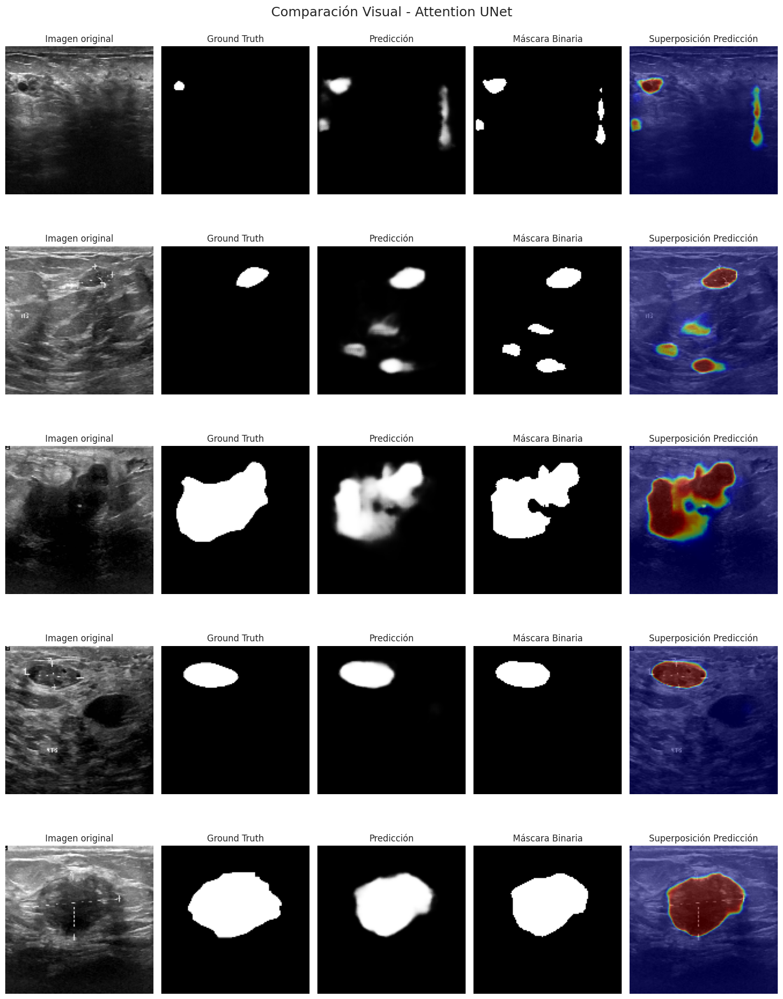

In [ ]:
evaluar_modelo(model_att_unet, X_test, y_test, nombre_modelo="Attention UNet")

#### **Mapas de error**

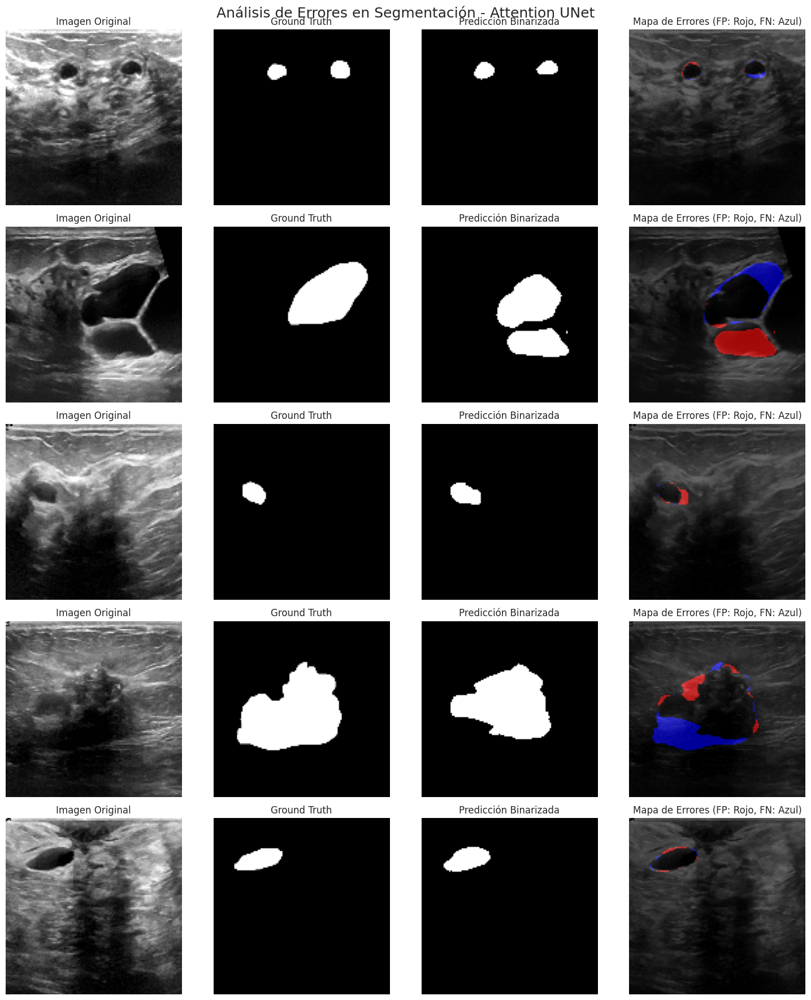

In [ ]:
visualizar_segmentacion(model_att_unet, X_test, y_test, nombre_modelo="Attention UNet")

#### **Curvas de evaluación**

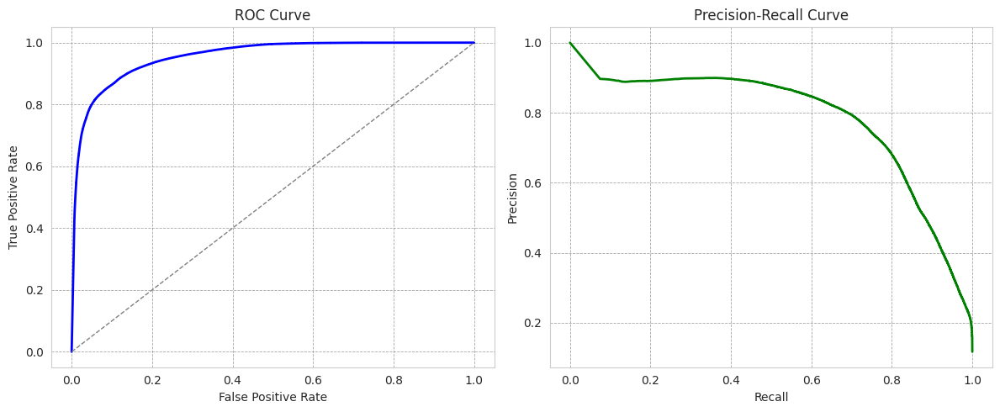

In [ ]:
plot_roc_pr_curves(y_test, y_pred)

#### **Distribución de métricas**

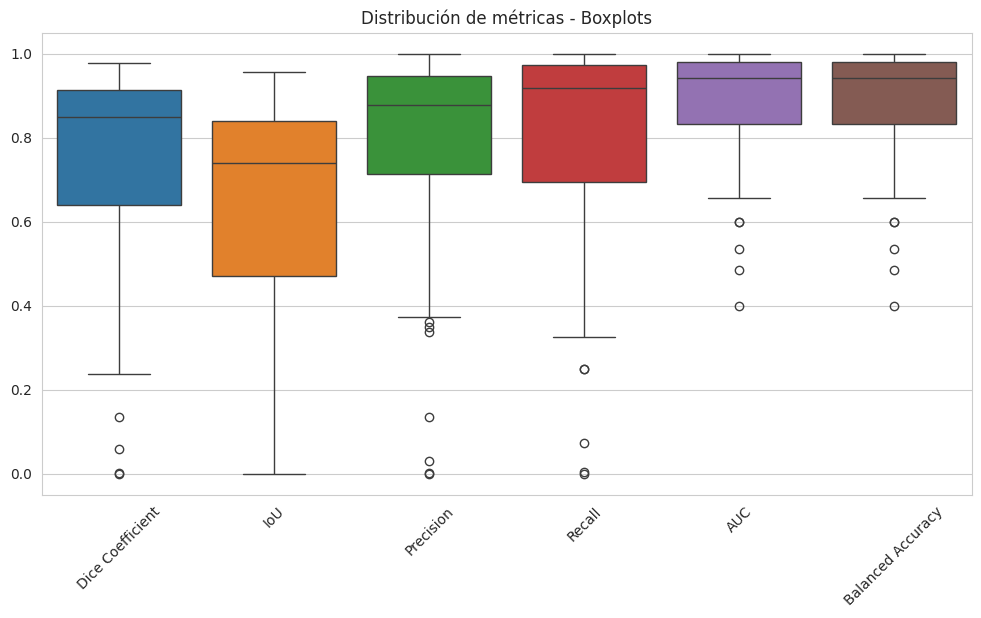

In [ ]:
boxplots(y_test, y_pred)

### **ResUNet**

#### **Arquitectura y entrenamiento**

In [ ]:
def res_block(input, num_filters):
    """Bloque residual con BatchNormalization y activación ReLU."""
    conv1 = Conv2D(num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(input)
    bn1 = BatchNormalization()(conv1)
    act1 = Activation("relu")(bn1)

    conv2 = Conv2D(num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(act1)
    bn2 = BatchNormalization()(conv2)

    # Conexión residual
    shortcut = Conv2D(num_filters, (1, 1), padding="same", kernel_initializer='he_normal')(input)
    shortcut = BatchNormalization()(shortcut)

    output = Add()([bn2, shortcut])
    output = Activation("relu")(output)

    return output

def encoder_block(input, num_filters):
    """Bloque codificador con convoluciones residuales y MaxPooling."""
    res = res_block(input, num_filters)
    pool = MaxPooling2D((2, 2))(res)
    return res, pool

def decoder_block(input, skip_features, num_filters):
    """Bloque decodificador con convoluciones residuales y concatenación con skip connections."""
    uconv = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    con = concatenate([uconv, skip_features])
    res = res_block(con, num_filters)
    return res

def build_resunet(input_shape):
    """Construcción de la arquitectura ResUNet."""
    input_layer = Input(input_shape)

    # Encoder
    s1, p1 = encoder_block(input_layer, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # Bottleneck
    b1 = res_block(p4, 1024)

    # Decoder
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    # Output layer
    output_layer = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(input_layer, output_layer, name="ResUNet")
    return model

# Crear el modelo
model_resunet = build_resunet(input_shape=(128, 128, 1))

# Compilar el modelo
model_resunet.compile(loss="binary_crossentropy", optimizer="Adam", metrics=[iou_metric])

In [ ]:

checkpointer = [
    EarlyStopping(monitor='val_mean_io_u', verbose=1, restore_best_weights=True, mode='max', patience=10),
    ModelCheckpoint(
        filepath='resunet_best.keras',
        monitor='val_mean_io_u',
        verbose=1,
        save_best_only=True,
        mode='max'
    )
]

history_resunet = None

if os.path.exists('history_resunet.joblib'):
    history_resunet = load('history_resunet.joblib')
    print("El archivo 'history_resunet.joblib' ya existe. Se ha cargado el historial del entrenamiento.")
else:
    history_resunet = model_resunet.fit(
        X_train, y_train,
        epochs=100,
        validation_data=(X_test, y_test),
        callbacks=checkpointer,
        verbose=2,
        batch_size=10
    )
    dump(history_resunet.history, 'history_resunet.joblib')
    print("El entrenamiento se ha completado y el historial ha sido guardado en 'history_resunet.joblib'.")

Epoch 1/100
49/49 - 60s - 1s/step - iou_metric: 0.2611 - loss: 0.2499 - val_iou_metric: 0.1332 - val_loss: 33.9909
Epoch 2/100
49/49 - 48s - 976ms/step - iou_metric: 0.4244 - loss: 0.1698 - val_iou_metric: 0.1836 - val_loss: 3.9105
Epoch 3/100
49/49 - 11s - 216ms/step - iou_metric: 0.4544 - loss: 0.1595 - val_iou_metric: 0.3609 - val_loss: 0.4607
Epoch 4/100
49/49 - 20s - 416ms/step - iou_metric: 0.5017 - loss: 0.1430 - val_iou_metric: 0.3251 - val_loss: 0.7870
Epoch 5/100
49/49 - 10s - 212ms/step - iou_metric: 0.5341 - loss: 0.1320 - val_iou_metric: 0.4486 - val_loss: 0.2640
Epoch 6/100
49/49 - 10s - 212ms/step - iou_metric: 0.5458 - loss: 0.1216 - val_iou_metric: 0.4810 - val_loss: 0.2658
Epoch 7/100
49/49 - 20s - 409ms/step - iou_metric: 0.5792 - loss: 0.1115 - val_iou_metric: 0.4737 - val_loss: 0.2327
Epoch 8/100
49/49 - 10s - 205ms/step - iou_metric: 0.5957 - loss: 0.1076 - val_iou_metric: 0.4281 - val_loss: 0.3026
Epoch 9/100
49/49 - 10s - 209ms/step - iou_metric: 0.6195 - loss: 

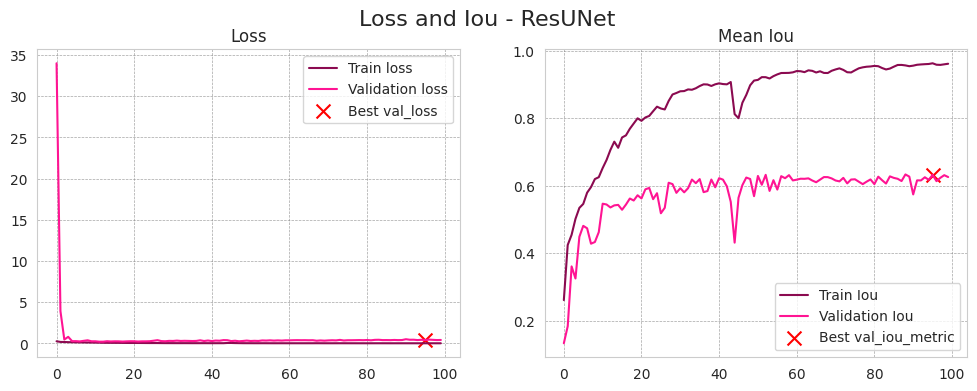

In [ ]:
graficar_historial(history_resunet, nombre_modelo="ResUNet")

#### **Métricas de evaluación**

In [ ]:
y_pred=model_resunet.predict(X_test,verbose=0)
y_pred_thresholded = y_pred > 0.5

IOU_keras = MeanIoU(num_classes=2)
IOU_keras.update_state(y_pred_thresholded, y_test)
iou_score = IOU_keras.result().numpy()

prec_score = Precision()
prec_score.update_state(y_pred_thresholded, y_test)
p = prec_score.result().numpy()

recall_score = Recall()
recall_score.update_state(y_pred_thresholded, y_test)
r = recall_score.result().numpy()

auc_score = AUC()
auc_score.update_state(y_pred_thresholded, y_test)
auc = auc_score.result().numpy()


intersection = np.sum(y_pred_thresholded * y_test)
union = np.sum(y_pred_thresholded) + np.sum(y_test)
dice_coefficient = (2. * intersection) / (union + 1e-7)  # Evitar división por cero


balanced_accuracy = (p + r) / 2

metrics_dict = {
    "Dice Coefficient": dice_coefficient,
    "Mean IoU": iou_score,
    "Precision": p,
    "Recall": r,
    "AUC": auc,
    "Balanced Accuracy": balanced_accuracy}

df_metrics_resunet = pd.DataFrame(metrics_dict, index=["Segmentación ResUNet"])
df_metrics_resunet.to_csv("resultados_resunet.csv")
df_metrics_resunet


,Dice Coefficient,Mean IoU,Precision,Recall,AUC,Balanced Accuracy
Segmentación ResUNet,0.728793,0.755126,0.664241,0.807467,0.884028,0.735854


#### **Comparación visual**

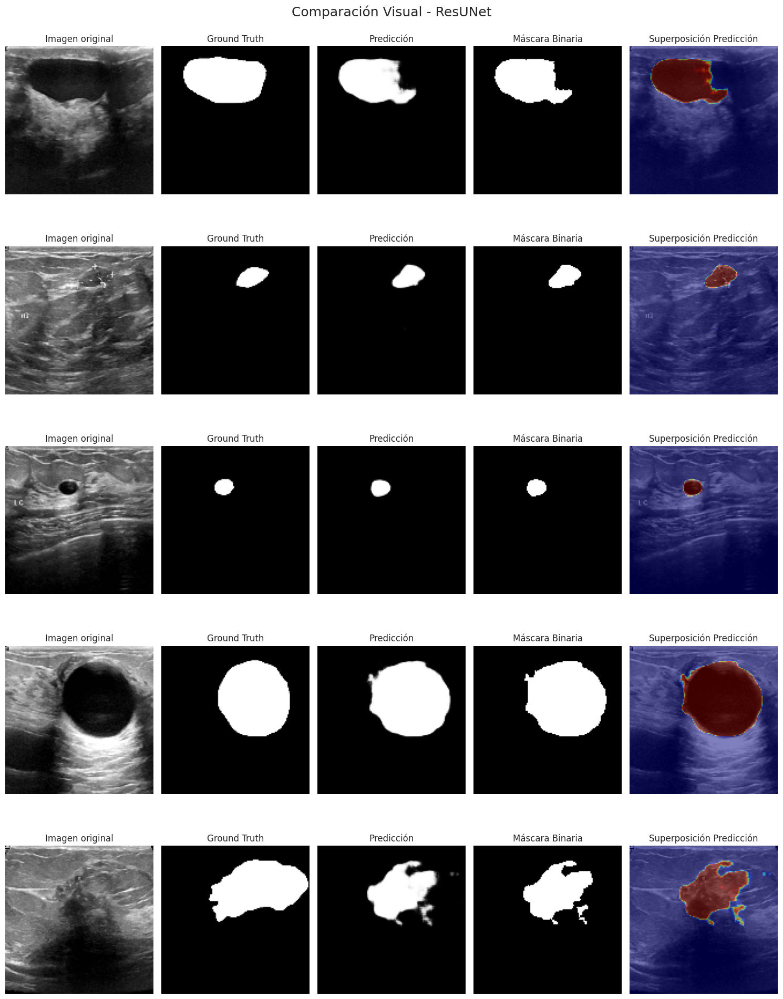

In [ ]:
evaluar_modelo(model_resunet, X_test, y_test, nombre_modelo="ResUNet")

#### **Mapas de error**

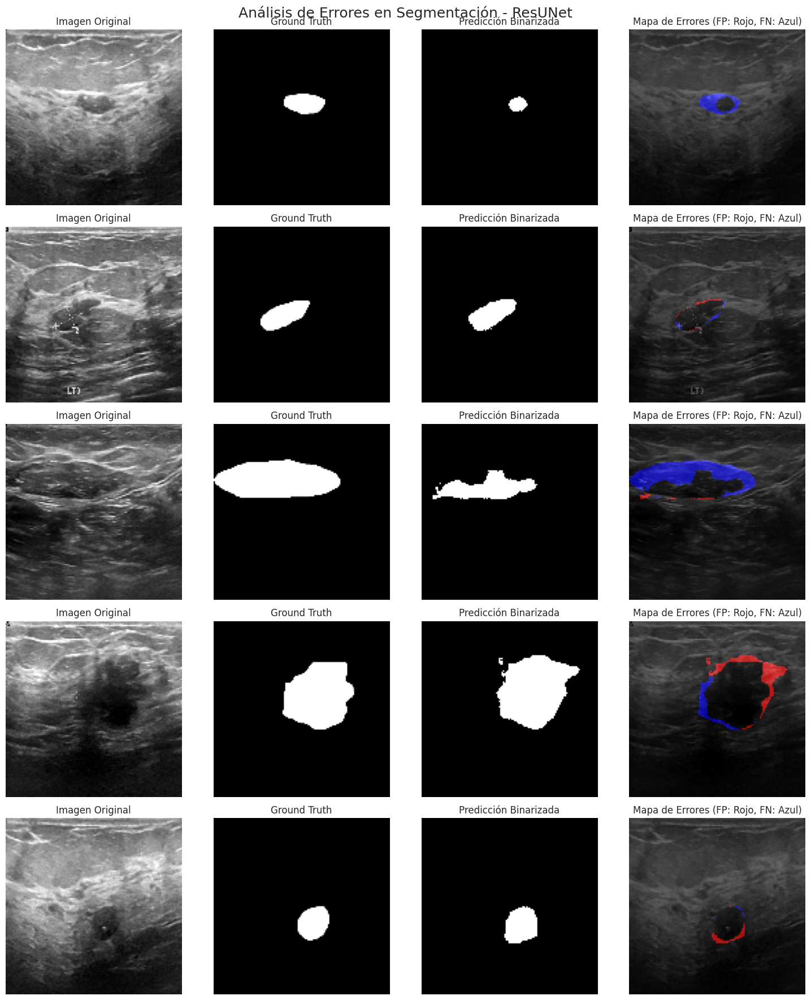

In [ ]:
visualizar_segmentacion(model_resunet, X_test, y_test, nombre_modelo="ResUNet")

#### **Curvas de evaluación**

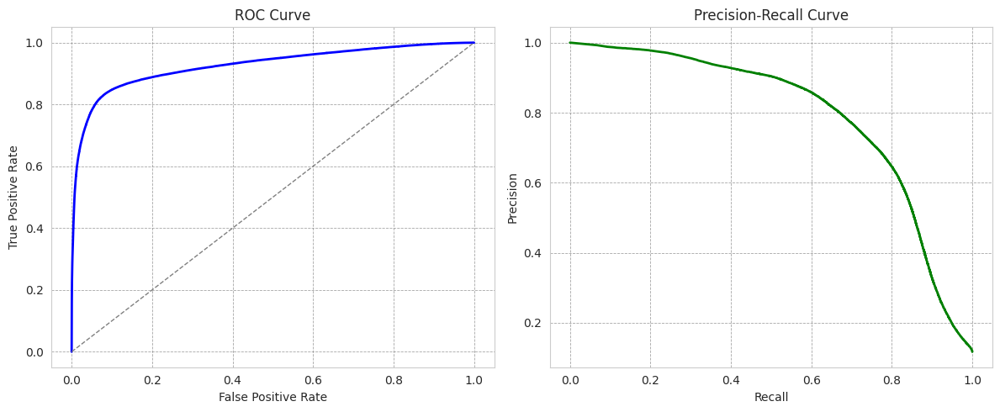

In [ ]:
plot_roc_pr_curves(y_test, y_pred)

#### **Distribución de métricas**

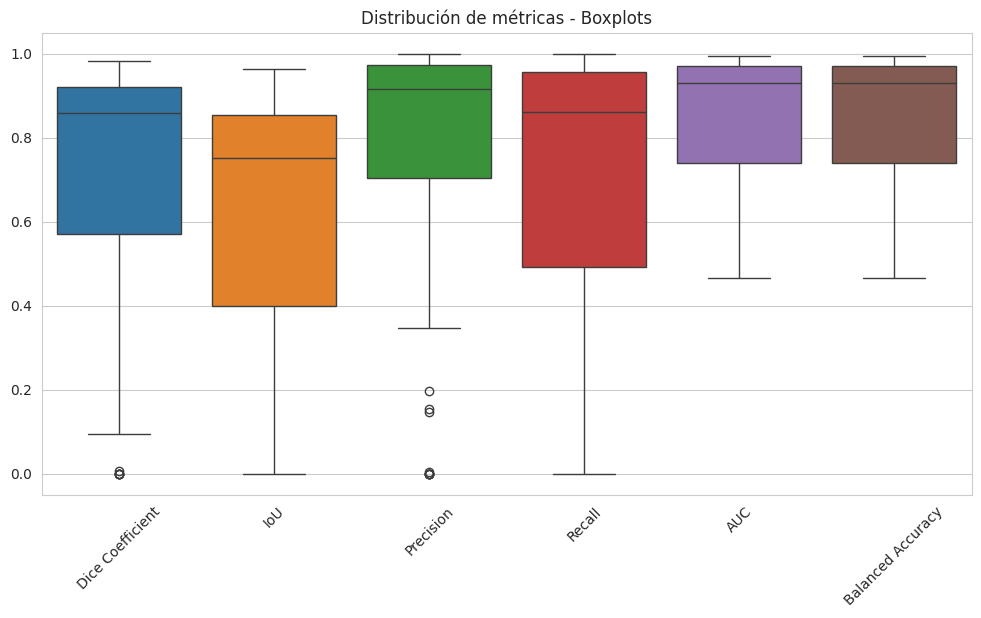

In [ ]:
boxplots(y_test, y_pred)

### **PSPNet**

#### **Arquitectura y entrenamiento**

In [17]:
# Función para el bloque convolucional
def conv_block(input, num_filters):
    conv = Conv2D(num_filters, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(input)
    conv = Conv2D(num_filters, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(conv)
    return conv

# Bloque de encoder
def encoder_block(input, num_filters):
    conv = conv_block(input, num_filters)
    pool = MaxPooling2D((2, 2))(conv)
    return conv, pool

# Módulo de Pooling Piramidal (PPM)
def pyramid_pooling_module(input):
    pool_sizes = [1, 2, 3, 6]
    pooled_outputs = []
    h, w = input.shape[1], input.shape[2]

    for size in pool_sizes:
        pool = AveragePooling2D(pool_size=(h//size, w//size), strides=(h//size, w//size))(input)
        conv = Conv2D(256, (1, 1), activation='relu', padding='same')(pool)
        up = UpSampling2D(size=(h//size, w//size), interpolation='bilinear')(conv)
        pooled_outputs.append(up)

    concat = concatenate([input] + pooled_outputs)
    return concat

# Bloque de decoder
def decoder_block(input, num_filters):
    conv = Conv2D(num_filters, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(input)
    conv = Conv2D(num_filters, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal')(conv)
    return conv

# Construcción del modelo PSPNet
def build_pspnet(input_shape):
    input_layer = Input(input_shape)

    # Encoder (similar a Unet pero sin skip connections directas)
    s1, p1 = encoder_block(input_layer, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # PPM
    ppm = pyramid_pooling_module(p4)

    # Decoder
    d1 = decoder_block(ppm, 512)
    d2 = decoder_block(d1, 256)
    d3 = decoder_block(d2, 128)
    d4 = decoder_block(d3, 64)

    # Salida

    upsampled_output = UpSampling2D(size=(16, 16), interpolation='bilinear')(d4)
    output_layer = Conv2D(1, (1, 1), activation='sigmoid', padding='same')(upsampled_output)

    model = Model(input_layer, output_layer, name="PSPNet")
    return model

# Crear el modelo PSPNet
model_pspnet = build_pspnet(input_shape=(128, 128, 1))
model_pspnet.compile(loss="binary_crossentropy", optimizer=Adam(), metrics=[iou_metric])

# Callbacks
checkpointer = [
    EarlyStopping(monitor='val_mean_io_u', verbose=1, restore_best_weights=True, mode='max', patience=10),
    ModelCheckpoint(filepath='model_pspnet.weights.best.keras', monitor='val_mean_io_u', verbose=1, save_best_only=True, mode='max')
]

# Entrenamiento
data_history_pspnet = None
if os.path.exists('history_pspnet.joblib'):
    data_history_pspnet = load('history_pspnet.joblib')
    print("Historial de entrenamiento cargado desde 'history_pspnet.joblib'.")
else:
    data_history_pspnet = model_pspnet.fit(
        X_train, y_train,
        epochs=100,
        validation_data=(X_val, y_val),
        callbacks=checkpointer,
        verbose=2,
        batch_size=10
    )
    dump(data_history_pspnet.history, 'history_pspnet.joblib')
    print("Entrenamiento completado y guardado en 'history_pspnet.joblib'.")


Epoch 1/100
49/49 - 30s - 618ms/step - iou_metric: 0.0305 - loss: 4.9481 - val_iou_metric: 2.6259e-09 - val_loss: 0.2624
Epoch 2/100
49/49 - 4s - 91ms/step - iou_metric: 0.0031 - loss: 0.2674 - val_iou_metric: 2.6259e-09 - val_loss: 0.2479
Epoch 3/100
49/49 - 5s - 92ms/step - iou_metric: 4.1625e-04 - loss: 0.2519 - val_iou_metric: 2.6259e-09 - val_loss: 0.2605
Epoch 4/100
49/49 - 5s - 100ms/step - iou_metric: 5.5145e-06 - loss: 0.2606 - val_iou_metric: 0.0197 - val_loss: 0.2604
Epoch 5/100
49/49 - 4s - 88ms/step - iou_metric: 0.0125 - loss: 0.2634 - val_iou_metric: 2.6259e-09 - val_loss: 0.2385
Epoch 6/100
49/49 - 4s - 88ms/step - iou_metric: 1.0291e-06 - loss: 0.2425 - val_iou_metric: 2.6259e-09 - val_loss: 0.2306
Epoch 7/100
49/49 - 5s - 106ms/step - iou_metric: 0.0250 - loss: 0.2313 - val_iou_metric: 0.1366 - val_loss: 0.2269
Epoch 8/100
49/49 - 4s - 89ms/step - iou_metric: 0.1394 - loss: 0.2181 - val_iou_metric: 0.1783 - val_loss: 0.2044
Epoch 9/100
49/49 - 5s - 105ms/step - iou_me

#### **Métricas de evaluación**

In [ ]:
y_pred=model_pspnet.predict(X_test,verbose=0)
y_pred_thresholded = y_pred > 0.5

IOU_keras = MeanIoU(num_classes=2)
IOU_keras.update_state(y_pred_thresholded, y_test)
iou_score = IOU_keras.result().numpy()

prec_score = Precision()
prec_score.update_state(y_pred_thresholded, y_test)
p = prec_score.result().numpy()

recall_score = Recall()
recall_score.update_state(y_pred_thresholded, y_test)
r = recall_score.result().numpy()

auc_score = AUC()
auc_score.update_state(y_pred_thresholded, y_test)
auc = auc_score.result().numpy()


intersection = np.sum(y_pred_thresholded * y_test)
union = np.sum(y_pred_thresholded) + np.sum(y_test)
dice_coefficient = (2. * intersection) / (union + 1e-7)  # Evitar división por cero


balanced_accuracy = (p + r) / 2

metrics_dict = {
    "Dice Coefficient": dice_coefficient,
    "Mean IoU": iou_score,
    "Precision": p,
    "Recall": r,
    "AUC": auc,
    "Balanced Accuracy": balanced_accuracy}
df_metrics_pspnet = pd.DataFrame(metrics_dict, index=["Segmentación PSPNet"])
df_metrics_pspnet.to_csv("resultados_pspnet.csv")
df_metrics_pspnet


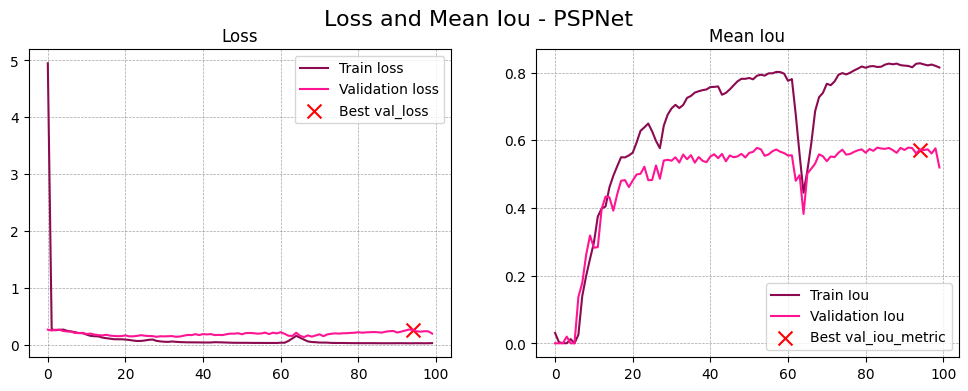

In [19]:
graficar_historial(data_history_pspnet, nombre_modelo="PSPNet")

#### **Comparación visual**

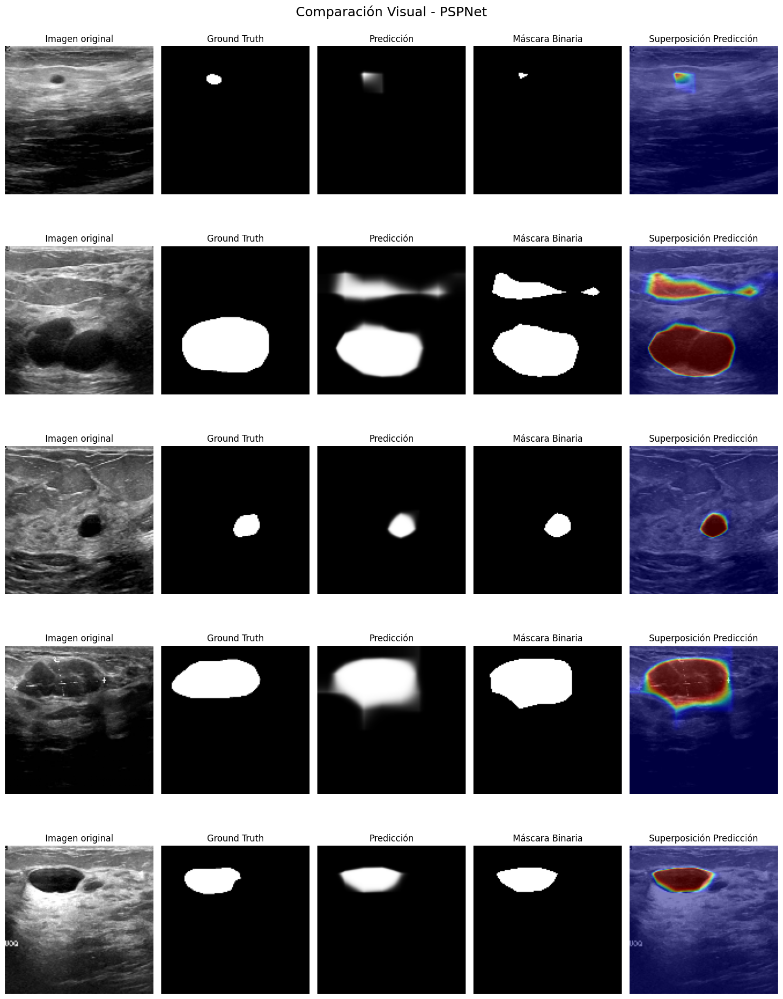

In [20]:
evaluar_modelo(model_pspnet, X_test, y_test, nombre_modelo="PSPNet")

#### **Mapas de error**

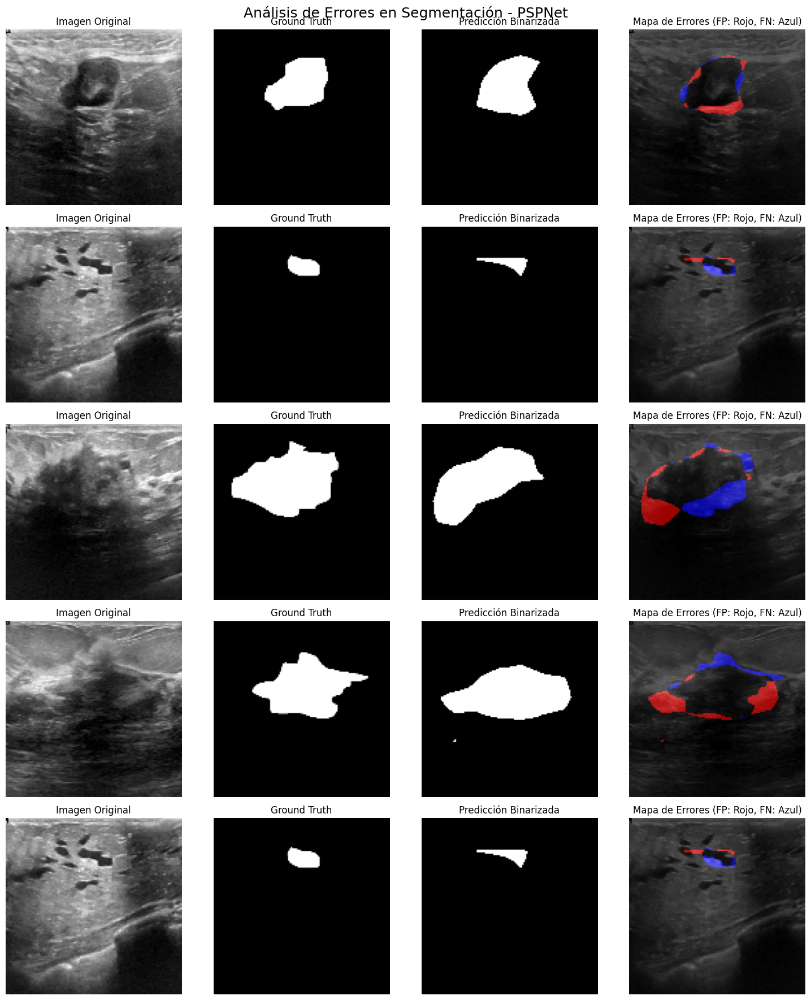

In [21]:
visualizar_segmentacion(model_pspnet, X_test, y_test, nombre_modelo="PSPNet")

#### **Curvas de evaluación**

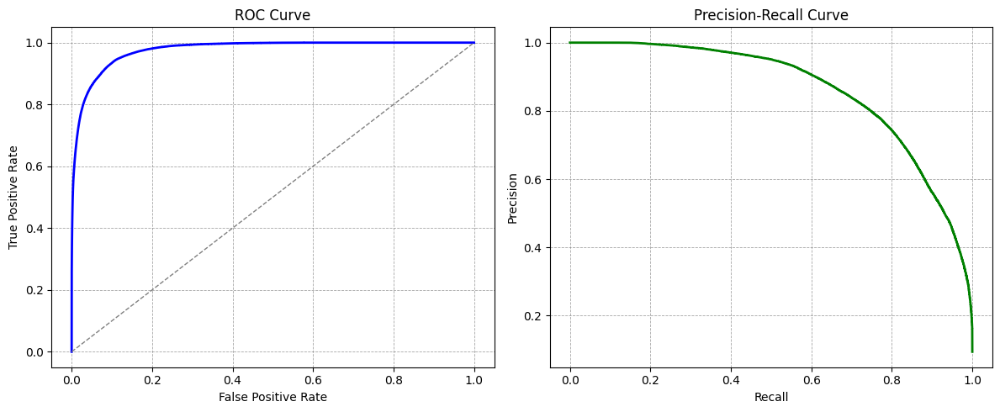

In [22]:
plot_roc_pr_curves(y_test, y_pred)

#### **Distribución de métricas**

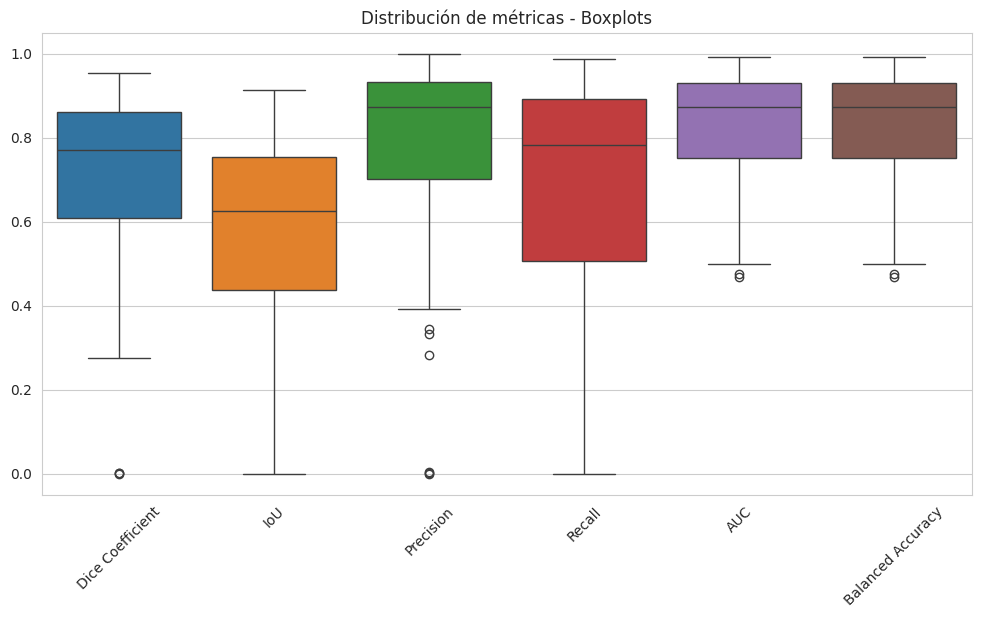

In [23]:
boxplots(y_test, y_pred)

### **FCN**

#### **Arquitectura y entrenamiento**

In [24]:
def conv_block(input, num_filters):
    conv = Conv2D(num_filters, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(input)
    conv = Conv2D(num_filters, (3, 3), activation="relu", padding="same", kernel_initializer='he_normal')(conv)
    return conv

def encoder_block(input, num_filters):
    conv = conv_block(input, num_filters)
    pool = MaxPooling2D((2, 2))(conv)
    return conv, pool

def build_fcn(input_shape):
    input_layer = Input(input_shape)

    s1, p1 = encoder_block(input_layer, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    fcn_conv1 = Conv2D(512, (3, 3), activation="relu", padding="same")(b1)
    fcn_conv2 = Conv2D(256, (3, 3), activation="relu", padding="same")(fcn_conv1)

    up1 = UpSampling2D((2, 2))(fcn_conv2)
    up2 = UpSampling2D((2, 2))(up1)
    up3 = UpSampling2D((2, 2))(up2)
    up4 = UpSampling2D((2, 2))(up3)

    output_layer = Conv2D(1, (1, 1), activation="sigmoid", padding="same")(up4)

    model = Model(input_layer, output_layer, name="FCN")
    return model

model_fcn = build_fcn(input_shape=(128, 128, 1))
model_fcn.compile(loss="binary_crossentropy", optimizer="Adam", metrics=[iou_metric])


In [25]:
checkpointer = [
    EarlyStopping(monitor='val_mean_io_u', verbose=1, restore_best_weights=True, mode='max', patience=10),
    ModelCheckpoint(
        filepath='model_fcn.weights.best.keras',
        monitor='val_mean_io_u',
        verbose=1,
        save_best_only=True,
        mode='max'
    )
]

history_fcn = None
if os.path.exists('history_fcn.joblib'):
    history_fcn = load('history_fcn.joblib')
    print("El archivo 'history_fcn.joblib' ya existe. Se ha cargado el historial del entrenamiento.")
else:
    history_fcn = model_fcn.fit(
        X_train, y_train,
        epochs=100,
        validation_data=(X_val, y_val),
        callbacks=checkpointer,
        verbose=2,
        batch_size=10
    )
    dump(history_fcn.history, 'history_fcn.joblib')
    print("El entrenamiento se ha completado y el historial ha sido guardado en 'history_fcn.joblib'.")

Epoch 1/100
49/49 - 18s - 376ms/step - iou_metric: 0.0033 - loss: 4.9430 - val_iou_metric: 2.6259e-09 - val_loss: 0.2882
Epoch 2/100
49/49 - 11s - 225ms/step - iou_metric: 0.0082 - loss: 0.2702 - val_iou_metric: 2.6259e-09 - val_loss: 0.2562
Epoch 3/100
49/49 - 5s - 103ms/step - iou_metric: 0.0577 - loss: 0.2448 - val_iou_metric: 0.1865 - val_loss: 0.2389
Epoch 4/100
49/49 - 5s - 105ms/step - iou_metric: 0.1515 - loss: 0.2299 - val_iou_metric: 0.1733 - val_loss: 0.2064
Epoch 5/100
49/49 - 5s - 103ms/step - iou_metric: 0.2150 - loss: 0.2054 - val_iou_metric: 0.2270 - val_loss: 0.2032
Epoch 6/100
49/49 - 5s - 92ms/step - iou_metric: 0.2186 - loss: 0.1989 - val_iou_metric: 0.1960 - val_loss: 0.1915
Epoch 7/100
49/49 - 5s - 103ms/step - iou_metric: 0.2463 - loss: 0.1967 - val_iou_metric: 0.2816 - val_loss: 0.1870
Epoch 8/100
49/49 - 5s - 103ms/step - iou_metric: 0.2859 - loss: 0.1848 - val_iou_metric: 0.2803 - val_loss: 0.1811
Epoch 9/100
49/49 - 5s - 92ms/step - iou_metric: 0.3020 - loss:

#### **Curvas de evaluación**

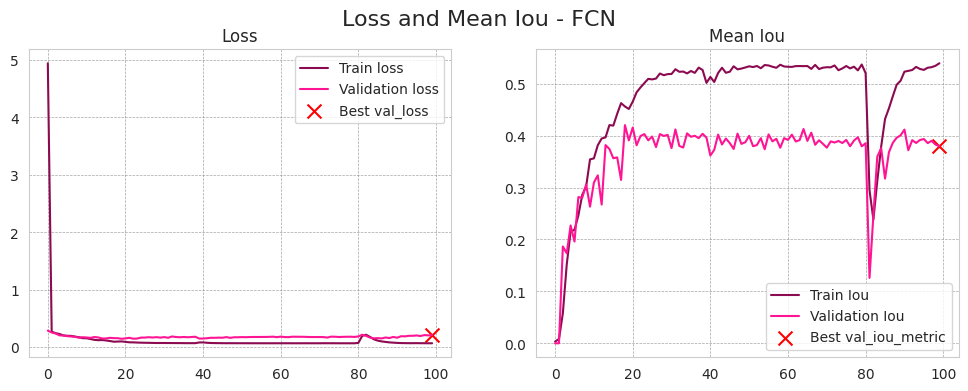

In [26]:
graficar_historial(history_fcn, nombre_modelo="FCN")

#### **Métricas de evaluación**

In [27]:
y_pred=model_fcn.predict(X_test,verbose=0)
y_pred_thresholded = y_pred > 0.5

IOU_keras = MeanIoU(num_classes=2)
IOU_keras.update_state(y_pred_thresholded, y_test)
iou_score = IOU_keras.result().numpy()

prec_score = Precision()
prec_score.update_state(y_pred_thresholded, y_test)
p = prec_score.result().numpy()

recall_score = Recall()
recall_score.update_state(y_pred_thresholded, y_test)
r = recall_score.result().numpy()

auc_score = AUC()
auc_score.update_state(y_pred_thresholded, y_test)
auc = auc_score.result().numpy()


intersection = np.sum(y_pred_thresholded * y_test)
union = np.sum(y_pred_thresholded) + np.sum(y_test)
dice_coefficient = (2. * intersection) / (union + 1e-7)  # Evitar división por cero


balanced_accuracy = (p + r) / 2

metrics_dict = {
    "Dice Coefficient": dice_coefficient,
    "Mean IoU": iou_score,
    "Precision": p,
    "Recall": r,
    "AUC": auc,
    "Balanced Accuracy": balanced_accuracy}
df_metrics_fcn = pd.DataFrame(metrics_dict, index=["Segmentación FCN"])
df_metrics_fcn.to_csv("resultados_fcn.csv")
df_metrics_fcn



,Dice Coefficient,Mean IoU,Precision,Recall,AUC,Balanced Accuracy
Segmentación FCN,0.697355,0.74195,0.607485,0.818203,0.891698,0.712844


#### **Comparación visual**

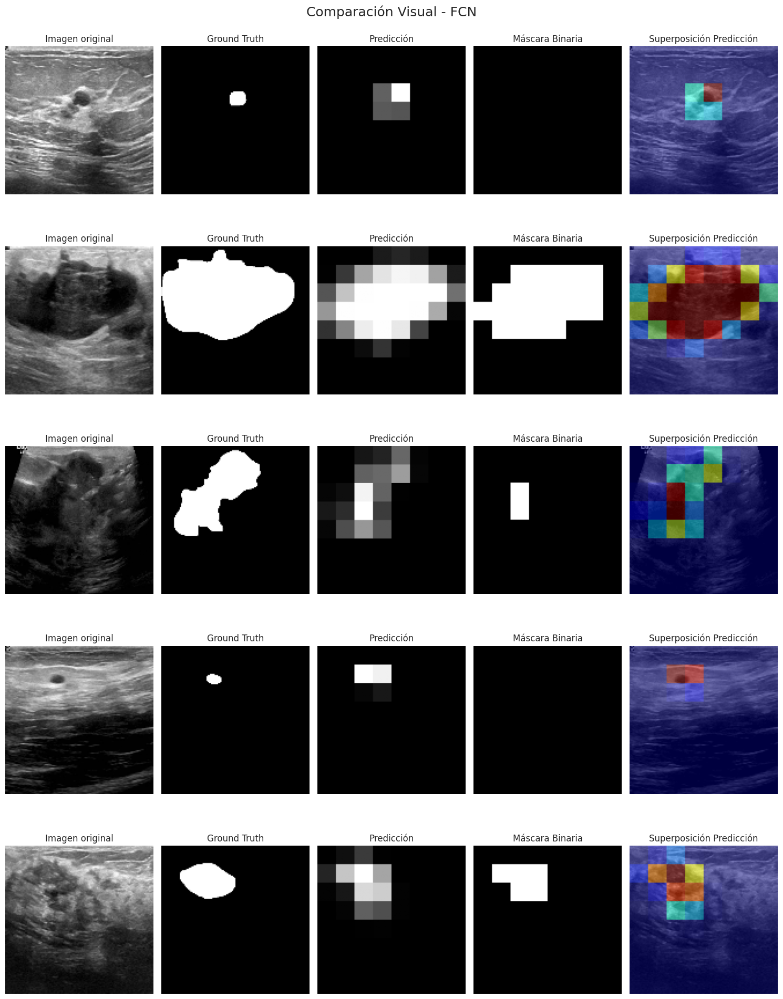

In [28]:
evaluar_modelo(model_fcn, X_test, y_test, nombre_modelo="FCN")

#### **Mapas de error**

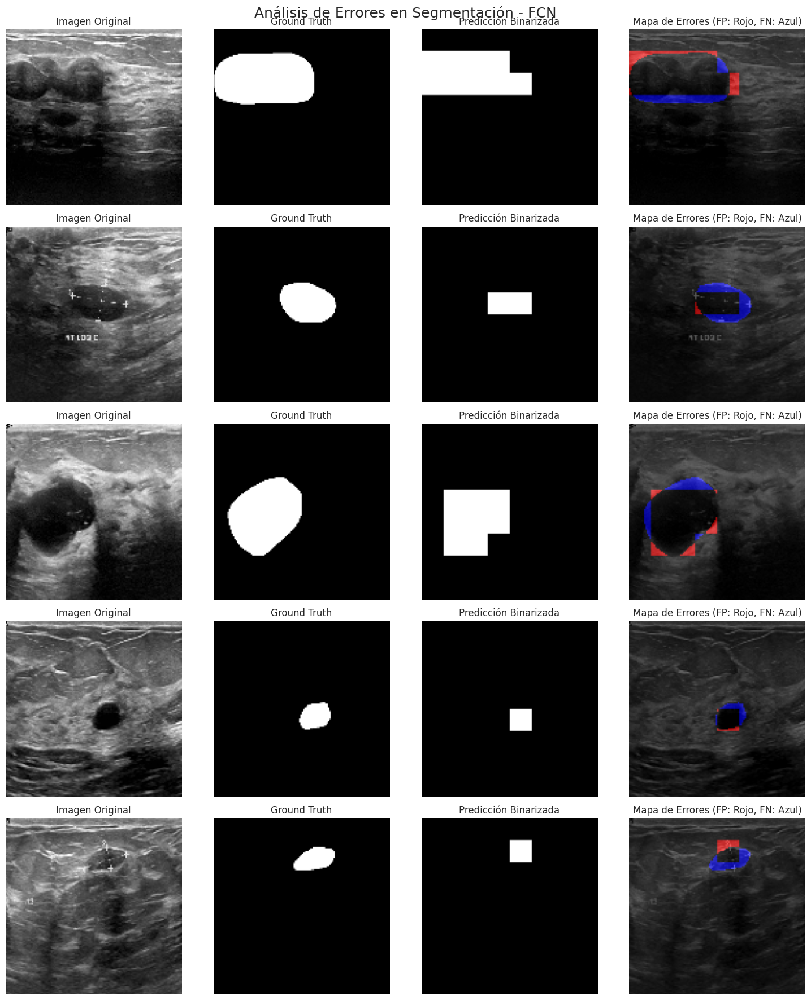

In [29]:
visualizar_segmentacion(model_fcn, X_test, y_test, nombre_modelo="FCN")

#### **Curvas de evaluación**

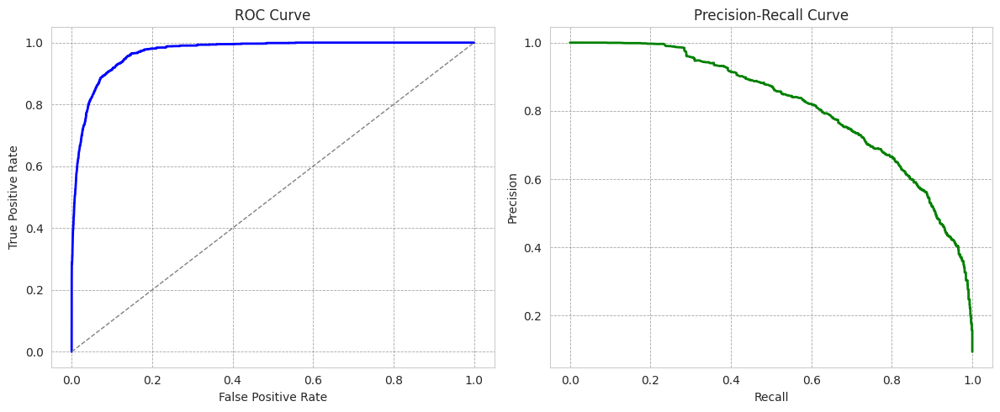

In [30]:
plot_roc_pr_curves(y_test, y_pred)

#### **Distribución de métricas**

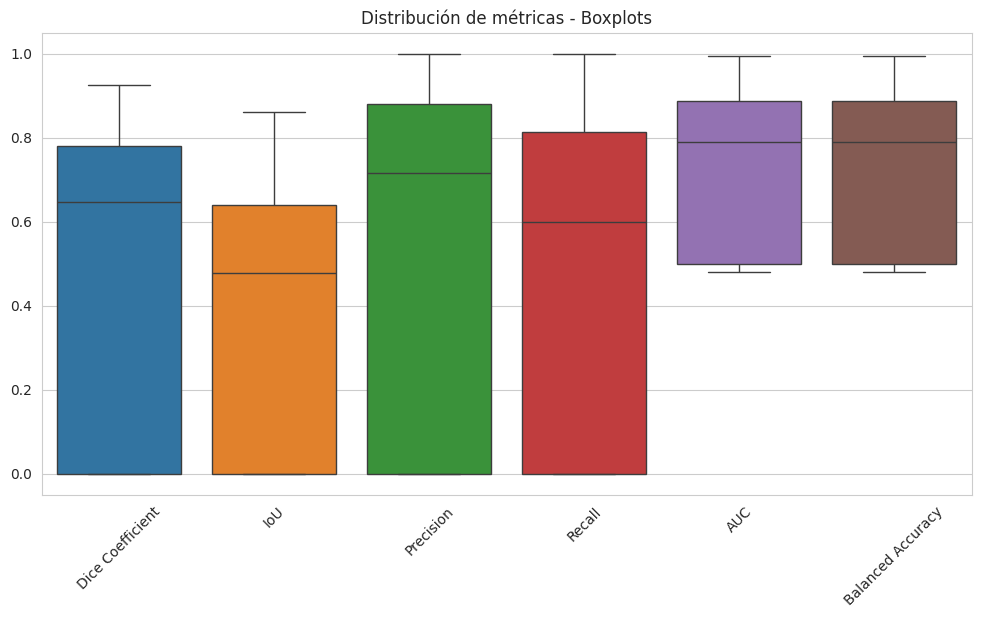

In [31]:
boxplots(y_test, y_pred)

## **Resultados e interpretaciones generales**

#### **Resultados**

In [7]:
df_resultados = pd.read_csv("tabla_metricas.csv")
df_resultados.drop(columns=["Unnamed: 0"], inplace=True)
df_resultados

,Modelo,Dice Coefficient,Mean IoU,Precision,Recall,AUC,Balanced Accuracy
0,U-Net,0.727057,0.754134,0.662543,0.805402,0.882914,0.733972
1,VNet,0.739280,0.764111,0.657537,0.844551,0.902005,0.751044
2,Seg-Net,0.666454,0.714102,0.571378,0.799591,0.874364,0.685484
3,Attention U-Net,0.744921,0.765869,0.701075,0.794778,0.879918,0.747926
4,ResUNet,0.728793,0.755126,0.664241,0.807467,0.884028,0.735854
5,PSPNet,0.737071,0.759338,0.706997,0.770351,0.867736,0.738674
6,FCN,0.697355,0.741950,0.607485,0.818203,0.891698,0.712844


Para la interpretación de las métricas tendremos en cuenta lo siguiente:
- **Intersection over Union (IoU)**: Mide la superposición entre la segmentación predicha y la real. Valores más altos indican una mejor segmentación.  

- **Recall vs. Precision**:  
  - **Recall más alto que precisión**: El modelo detecta la mayoría de los píxeles relevantes (buen cubrimiento), pero también genera falsos positivos.  
  - **Precision más alto que recall**: El modelo es más conservador y evita falsos positivos, pero puede no detectar todos los píxeles relevantes.  

- **Dice Coefficient**: Métrica similar al IoU, pero más sensible a la distribución de píxeles. Un valor alto indica una gran coincidencia entre la máscara predicha y la real.

- **Área Bajo la Curva (AUC)**: Evalúa el rendimiento del modelo en diferentes umbrales de decisión. Un AUC alto indica que el modelo segmenta bien en distintas condiciones.  

- **Balanced Accuracy**: Promedia la sensibilidad (recall) y la especificidad, útil en conjuntos de datos desbalanceados. Un valor alto indica que el modelo trata bien ambas clases (píxeles de la estructura y fondo).  


#### **Interpretación**



En general, los modelos **Attention U-Net** y **VNet** presentan los mejores resultados en términos de superposición entre la segmentación predicha y la real. Attention U-Net obtuvo el **mayor Dice Coefficient (0.7449)** y el **Mean IoU más alto (0.7659)**, lo que sugiere una capacidad sobresaliente para delinear con precisión las regiones tumorales. VNet, con un **Dice Coefficient de 0.7393** y un **Mean IoU de 0.7641**, también demostró un alto rendimiento en esta tarea.

En cuanto a la **sensibilidad (Recall)**, **VNet** se posiciona como el mejor modelo con un valor de **0.8446**, indicando una excelente capacidad para identificar correctamente los píxeles tumorales, minimizando los falsos negativos. Le sigue el modelo **FCN**, con un valor de **0.8182**, aunque su precisión es considerablemente menor (**0.6075**), lo que sugiere un mayor número de falsos positivos.

Desde la perspectiva de la **precisión**, los modelos **PSPNet (0.7070)** y **Attention U-Net (0.7011)** destacan por su capacidad para generar predicciones confiables, cometiendo menos errores al clasificar píxeles como tumorales cuando no lo son.

Al analizar el área bajo la curva ROC (**AUC**), el modelo **VNet** nuevamente sobresale con un valor de **0.9020**, evidenciando una mayor robustez en distintos umbrales de decisión. Lo siguen **ResUNet (0.8840)** y **FCN (0.8917)**, aunque este último presenta deficiencias en otras métricas fundamentales, como el Dice Coefficient.

La **Balanced Accuracy**, que considera el equilibrio entre clases al evaluar tanto los verdaderos positivos como los verdaderos negativos, muestra que **VNet (0.7510)** y **Attention U-Net (0.7479)** son los modelos más equilibrados. Esto indica una adecuada capacidad para segmentar tanto el tejido tumoral como el fondo sin sesgo aparente hacia una de las clases.

En contraste, el modelo **Seg-Net** exhibe el desempeño más bajo en múltiples métricas clave. Con un **Dice Coefficient de 0.6665**, una **precisión de 0.5714** y una **Balanced Accuracy de 0.6855**, presenta una tendencia marcada a generar falsos positivos, a pesar de tener un recall relativamente alto (**0.7996**). Esto sugiere una detección agresiva de píxeles tumorales, aunque con una alta tasa de error.

En conclusión, los modelos **Attention U-Net** y **VNet** se posicionan como las opciones más adecuadas para la segmentación de tumores en imágenes de ultrasonido, al presentar un equilibrio óptimo entre precisión, sensibilidad y estabilidad bajo diferentes condiciones. En contraste, **Seg-Net y FCN** presentan limitaciones importantes, siendo menos confiables para aplicaciones clínicas donde la precisión y el equilibrio en la detección son fundamentales.

